In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mlflow

In [48]:
train = pd.read_csv("./train_cleaned_with_kriging.csv")
valid = pd.read_csv("./val_cleaned_with_kriging.csv")
mlflow.end_run()

C:\Users\Usuario\AppData\Local\Temp\ipykernel_22080\3419535525.py:2: DtypeWarning: Columns (19) have mixed types. Specify dtype option on import or set low_memory=False.
  valid = pd.read_csv("./val_cleaned_with_kriging.csv")


In [49]:
test = pd.read_csv("./test_cleaned_with_kriging.csv")

C:\Users\Usuario\AppData\Local\Temp\ipykernel_22080\2557104952.py:1: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  test = pd.read_csv("./test_cleaned_with_kriging.csv")


In [50]:
test.shape

(22039, 368)

In [51]:
X_train = train.drop('Listing.Price.ClosePrice', axis=1)
y_train = train['Listing.Price.ClosePrice']

X_valid = valid.drop('Listing.Price.ClosePrice', axis=1)
y_valid = valid['Listing.Price.ClosePrice']

In [52]:
# nos quedamos con las columnas que tienen en comun train y test
common_cols = set(X_train.columns) & set(test.columns)

X_train = X_train[list(common_cols)]

X_valid = X_valid[list(common_cols)]

test = test[list(common_cols)]

X_train.shape, X_valid.shape, test.shape

((85949, 368), (21488, 368), (22039, 368))

## Juntem variables

In [53]:
## Juntem variables c1c6 i q1q6
import numpy as np

# Crear la columna combinada (media de las dos columnas después de imputar)
X_train['ImageData.summary.exterior'] = (X_train['ImageData.c1c6.summary.property'] + X_train['ImageData.q1q6.summary.property']) / 2
X_valid['ImageData.summary.exterior'] = (X_valid['ImageData.c1c6.summary.property'] + X_valid['ImageData.q1q6.summary.property']) / 2
test['ImageData.summary.exterior'] = (test['ImageData.c1c6.summary.property'] + test['ImageData.q1q6.summary.property']) / 2

# Eliminar las columnas originales (opcional)
X_train.drop(columns=['ImageData.c1c6.summary.property', 'ImageData.q1q6.summary.property'], inplace=True)
X_valid.drop(columns=['ImageData.c1c6.summary.property', 'ImageData.q1q6.summary.property'], inplace=True)
test.drop(columns=['ImageData.c1c6.summary.property', 'ImageData.q1q6.summary.property'], inplace=True)

# juntamos ImageData.c1c6.summary.exterior, ImageData.q1q6.summary.exterior con la media de los valores no nulos
X_train['ImageData.q1q6.summary.interior'] = X_train['ImageData.q1q6.summary.interior'].astype(float)
X_train['ImageData.c1c6.summary.interior'] = X_train['ImageData.c1c6.summary.interior'].astype(float)
X_train['ImageData.summary.interior'] = (X_train['ImageData.c1c6.summary.interior'] + X_train['ImageData.q1q6.summary.interior']) / 2

X_valid['ImageData.q1q6.summary.interior'] = X_valid['ImageData.q1q6.summary.interior'].astype(float)
X_valid['ImageData.c1c6.summary.interior'] = X_valid['ImageData.c1c6.summary.interior'].astype(float)
X_valid['ImageData.summary.interior'] = (X_valid['ImageData.c1c6.summary.interior'] + X_valid['ImageData.q1q6.summary.interior']) / 2

test['ImageData.q1q6.summary.interior'] = test['ImageData.q1q6.summary.interior'].astype(float)
test['ImageData.c1c6.summary.interior'] = test['ImageData.c1c6.summary.interior'].astype(float)
test['ImageData.summary.interior'] = (test['ImageData.c1c6.summary.interior'] + test['ImageData.q1q6.summary.interior']) / 2

# Eliminar las columnas que ya no necesitamos
X_train.drop(columns=['ImageData.c1c6.summary.interior', 'ImageData.q1q6.summary.interior'], inplace=True)
X_valid.drop(columns=['ImageData.c1c6.summary.interior', 'ImageData.q1q6.summary.interior'], inplace=True)
test.drop(columns=['ImageData.c1c6.summary.interior', 'ImageData.q1q6.summary.interior'], inplace=True)


X_train['ImageData.q1q6.summary.bathroom'] = X_train['ImageData.q1q6.summary.bathroom'].astype(float)
X_train['ImageData.c1c6.summary.bathroom'] = X_train['ImageData.c1c6.summary.bathroom'].astype(float)
X_train['ImageData.summary.bathroom'] = (X_train['ImageData.q1q6.summary.bathroom'] + X_train['ImageData.c1c6.summary.bathroom']) / 2

X_valid['ImageData.q1q6.summary.bathroom'] = X_valid['ImageData.q1q6.summary.bathroom'].astype(float)
X_valid['ImageData.c1c6.summary.bathroom'] = X_valid['ImageData.c1c6.summary.bathroom'].astype(float)
X_valid['ImageData.summary.bathroom'] = (X_valid['ImageData.c1c6.summary.bathroom'] + X_valid['ImageData.q1q6.summary.bathroom']) / 2

test['ImageData.q1q6.summary.bathroom'] = test['ImageData.q1q6.summary.bathroom'].astype(float)
test['ImageData.c1c6.summary.bathroom'] = test['ImageData.c1c6.summary.bathroom'].astype(float)
test['ImageData.summary.bathroom'] = (test['ImageData.c1c6.summary.bathroom'] + test['ImageData.q1q6.summary.bathroom']) / 2


# Eliminar las columnas que ya no necesitamos
X_train.drop(columns=['ImageData.q1q6.summary.bathroom', 'ImageData.c1c6.summary.bathroom'], inplace=True)
X_valid.drop(columns=['ImageData.q1q6.summary.bathroom', 'ImageData.c1c6.summary.bathroom'], inplace=True)
test.drop(columns=['ImageData.q1q6.summary.bathroom', 'ImageData.c1c6.summary.bathroom'], inplace=True)

X_train['ImageData.q1q6.summary.kitchen'] = X_train['ImageData.q1q6.summary.kitchen'].astype(float)
X_train['ImageData.c1c6.summary.kitchen'] = X_train['ImageData.c1c6.summary.kitchen'].astype(float)
X_train['ImageData.summary.kitchen'] = (X_train['ImageData.q1q6.summary.kitchen'] + X_train['ImageData.c1c6.summary.kitchen']) / 2

X_valid['ImageData.q1q6.summary.kitchen'] = X_valid['ImageData.q1q6.summary.kitchen'].astype(float)
X_valid['ImageData.c1c6.summary.kitchen'] = X_valid['ImageData.c1c6.summary.kitchen'].astype(float)
X_valid['ImageData.summary.kitchen'] = (X_valid['ImageData.c1c6.summary.kitchen'] + X_valid['ImageData.q1q6.summary.kitchen']) / 2

test['ImageData.q1q6.summary.kitchen'] = test['ImageData.q1q6.summary.kitchen'].astype(float)
test['ImageData.c1c6.summary.kitchen'] = test['ImageData.c1c6.summary.kitchen'].astype(float)
test['ImageData.summary.kitchen'] = (test['ImageData.c1c6.summary.kitchen'] + test['ImageData.q1q6.summary.kitchen']) / 2

# Eliminar las columnas que ya no necesitamos
X_train.drop(columns=['ImageData.q1q6.summary.kitchen', 'ImageData.c1c6.summary.kitchen'], inplace=True)
X_valid.drop(columns=['ImageData.q1q6.summary.kitchen', 'ImageData.c1c6.summary.kitchen'], inplace=True)
test.drop(columns=['ImageData.q1q6.summary.kitchen', 'ImageData.c1c6.summary.kitchen'], inplace=True)


In [54]:
X_train['Listing.Dates.CloseDate'] = pd.to_datetime(X_train['Listing.Dates.CloseDate'])
X_train['CloseDate_Month'] = X_train['Listing.Dates.CloseDate'].dt.month
#X_train['CloseDate_Year'] = X_train['Listing.Dates.CloseDate'].dt.year
X_train['CloseDate_Season'] = X_train['Listing.Dates.CloseDate'].dt.month.map({
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
})

In [55]:
X_valid['Listing.Dates.CloseDate'] = pd.to_datetime(X_valid['Listing.Dates.CloseDate'])
X_valid['CloseDate_Month'] = X_valid['Listing.Dates.CloseDate'].dt.month
#X_valid['CloseDate_Year'] = X_valid['Listing.Dates.CloseDate'].dt.year
X_valid['CloseDate_Season'] = X_valid['Listing.Dates.CloseDate'].dt.month.map({
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
})

In [56]:
test['Listing.Dates.CloseDate'] = pd.to_datetime(test['Listing.Dates.CloseDate'])
test['CloseDate_Month'] = test['Listing.Dates.CloseDate'].dt.month
#test['CloseDate_Year'] = test['Listing.Dates.CloseDate'].dt.year
test['CloseDate_Season'] = test['Listing.Dates.CloseDate'].dt.month.map({
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
})

## Passem les categoriques a numeriques

In [9]:
import pandas as pd
from category_encoders import BinaryEncoder

# Identificar las variables categóricas
categorical_cols = X_train.select_dtypes(include=['object']).columns

# Crear el codificador binario
binary_encoder = BinaryEncoder(cols=categorical_cols, drop_invariant=True)

# Aplicar la transformación
X_train_encoded_cat = binary_encoder.fit_transform(X_train)
X_val_encoded_cat = binary_encoder.transform(X_valid)
X_test_encoded_cat = binary_encoder.transform(test)

# usar las variables categóricas codificadas con las variables numéricas
X_train_encoded = pd.concat([X_train_encoded_cat, X_train.drop(columns=categorical_cols)], axis=1)
X_val_encoded = pd.concat([X_val_encoded_cat, X_valid.drop(columns=categorical_cols)], axis=1)
X_test_encoded = pd.concat([X_test_encoded_cat, test.drop(columns=categorical_cols)], axis=1)




KeyboardInterrupt: 

## LR

RMSE: 254231.77896745986
R^2: 0.5320549279007201


2024/11/17 04:02:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Top 5 variables by coefficient magnitude:
                  Feature    Coefficient
61       chillers_cooling  481892.893824
111       Unknown_heating  424550.675995
130   office only_cooling  378783.835711
22        WineCellar_room  279227.640517
145  beach_characteristic  251474.966190


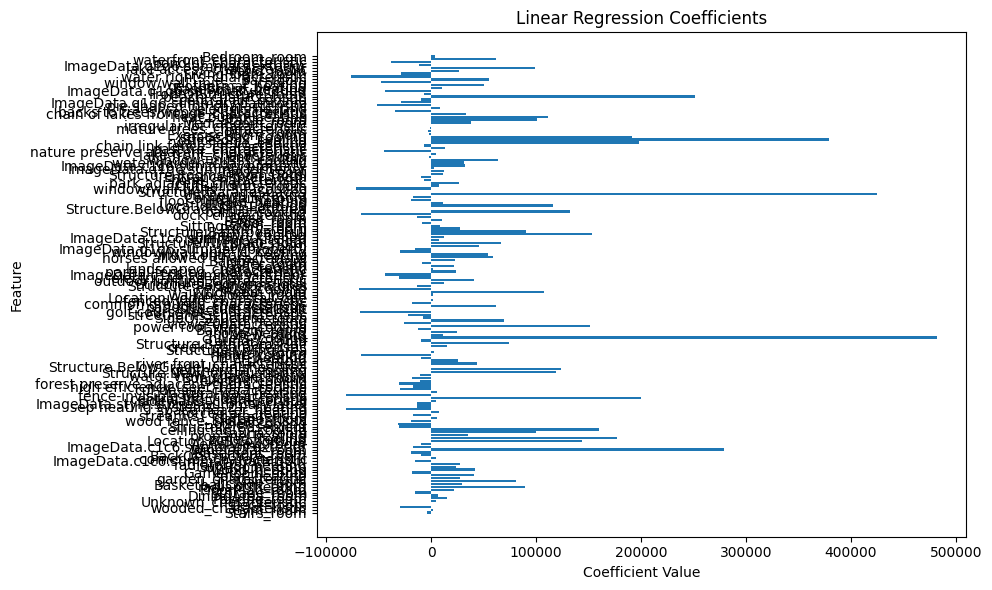

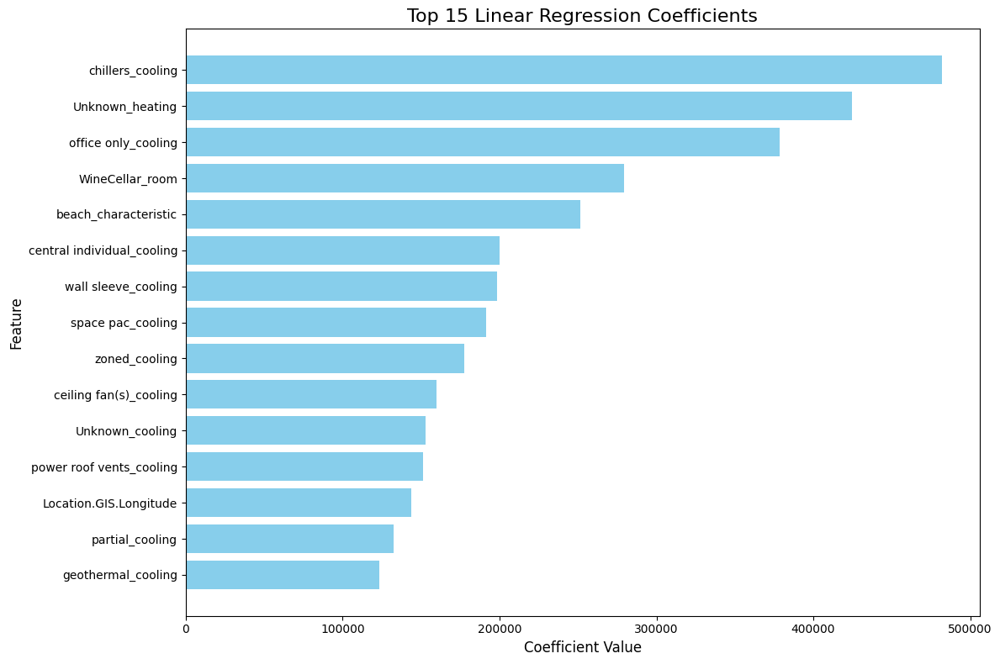

Linear regression model trained and logged to MLflow


<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import mlflow
import matplotlib.pyplot as plt

def train_linear_regression():
    # Load and preprocess the data
    X_train = train.drop("Listing.Price.ClosePrice", axis=1)
    y_train = train["Listing.Price.ClosePrice"]

    X_val = valid.drop("Listing.Price.ClosePrice", axis=1)
    y_val = valid["Listing.Price.ClosePrice"]

    # Get just the numeric features
    X_train = X_train.select_dtypes(exclude=['object'])
    X_val = X_val.select_dtypes(exclude=['object'])

    # Start an MLflow run
    mlflow.set_experiment("Linear Regression House Price Prediction")
    mlflow.start_run()

    columns_to_log = X_train.columns
    mlflow.log_param("columns", columns_to_log)

    # Create and train the linear regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Evaluate the model with RMSE
    y_pred = model.predict(X_val)
    mse = mean_squared_error(y_val, y_pred)
    rmse = np.sqrt(mse)
    print(f"RMSE: {rmse}")
    
    # Calculate R^2
    r2 = model.score(X_val, y_val)
    print(f"R^2: {r2}")

    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    mlflow.sklearn.log_model(model, "model")

    # Generate a bar chart for the coefficients
    coef = model.coef_
    features = X_train.columns
    plt.figure(figsize=(10, 6))
    plt.barh(features, coef)
    plt.xlabel('Coefficient Value')
    plt.ylabel('Feature')
    plt.title('Linear Regression Coefficients')
    plt.tight_layout()

    # Generar gráfico con mejoras

    # Print the top 5 variables by coefficient magnitude
    coef_with_features = pd.DataFrame({
        "Feature": features,
        "Coefficient": coef
    })
    coef_with_features["AbsCoefficient"] = coef_with_features["Coefficient"].abs()
    top_features = coef_with_features.sort_values("AbsCoefficient", ascending=False).head(5)
    print("Top 5 variables by coefficient magnitude:")
    print(top_features[["Feature", "Coefficient"]])
    
    top_features = coef_with_features.sort_values("AbsCoefficient", ascending=False).head(15)
    
    plt.figure(figsize=(12, 8))  # Ajustar tamaño
    plt.barh(top_features["Feature"], top_features["Coefficient"], color='skyblue')
    plt.xlabel('Coefficient Value', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.title('Top 15 Linear Regression Coefficients', fontsize=16)
    plt.gca().invert_yaxis()  # Invertir el eje Y para que la más importante esté arriba
    plt.tight_layout()
    
    # Guardar y mostrar el gráfico
    plt.savefig("improved_linear_regression_coefficients.png")
    plt.show()

    # Save the plot as an image
    plt.savefig("linear_regression_coefficients.png")

    # Log the image to MLflow
    mlflow.log_artifact("improved_linear_regression_coefficients.png")

    print("Linear regression model trained and logged to MLflow")
    
    # Finalize the experiment run
    mlflow.end_run()

# Train the linear regression model
train_linear_regression()

## Añadir tasa de criminalidad

In [43]:
!pip install openpolicedata

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/15.5 MB ? eta -:--:--
   ----- ---------------------------------- 2.1/15.5 MB 16.8 MB/s eta 0:00:01
   -------------- ------------------------- 5.8/15.5 MB 14.7 MB/s eta 0:00:01
   ---------------------- ----------------- 8.7/15.5 MB 14.5 MB/s eta 0:00:01
   ---------------------------- ----------- 11.0/15.5 MB 13.8 MB/s eta 0:00:01
   ----------------------------------- ---- 13.9/15.5 MB 13.6 MB/s eta 0:00:01
   ---------------------------------------  15.5/15.5 MB 13.2 MB/s eta 0:00:01
   ---------------------------------------- 15.5/15.5 MB 12.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/3.8 MB ? eta -:--:--
   --------------------------- ------------ 2.6/3.8 MB 11.6 MB/s eta 0:00:01
   ---------------------------------------- 3.8/3.8 MB 12.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    

  You can safely remove it manually.
  You can safely remove it manually.

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\FX517\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [41]:
train.columns

Index(['Stairs_room', 'Gym_room', 'wooded_characteristic', 'Deck_room',
       'Unknown_characteristic', 'Parking_room', 'DiningArea_room',
       'Storage_room', 'FloorPlan_room', 'radiant_heating',
       ...
       'window/wall units - 2_cooling', 'Bar_room',
       'water rights_characteristic', 'LivingRoom_room', 'Patio_room',
       'lake access_characteristic', 'ImageData.q1q6.summary.exterior',
       'pond(s)_characteristic', 'waterfront_characteristic', 'Bedroom_room'],
      dtype='object', length=180)

In [53]:
import pandas as pd
import openpolicedata as opd

# Seleccionamos una fuente de datos compatible con criminalidad
# Aquí, 'Baltimore' es solo un ejemplo; consulta otros conjuntos compatibles con OPD.
source = opd.Source.get_tables_types("Baltimore", "crime")

# Filtramos datos de criminalidad según rango de tiempo y ubicación
incident_data = source.load_data(date_range=("2023-01-01", "2023-12-31"))

# Cálculo de tasas de criminalidad por coordenadas (se necesita procesar a nivel geográfico)
# Ejemplo: agrupar incidentes cercanos
from geopy.distance import geodesic

def get_crime_rate(lat, lon, data, radius_km=5):
    """Calcular tasa de criminalidad dentro de un radio específico"""
    crime_count = 0
    for _, row in data.iterrows():
        crime_loc = (row['latitude'], row['longitude'])
        if geodesic((lat, lon), crime_loc).km <= radius_km:
            crime_count += 1
    return crime_count

# Añadimos la nueva variable 'crime_rate' al dataset
train['crime_rate'] = train.apply(
    lambda row: get_crime_rate(row['latitude'], row['longitude'], incident_data, radius_km=5),
    axis=1
)

print(train['crime_rate'].head())


TypeError: Source.get_tables_types() takes 1 positional argument but 2 were given

## Analisi Bivariate

In [55]:
train = pd.read_csv("C:/Users/FX517/OneDrive - Universitat Politècnica de Catalunya/Escritorio/Hackathons/RelsB/data/trained_clean.csv")
valid = pd.read_csv("C:/Users/FX517/OneDrive - Universitat Politècnica de Catalunya/Escritorio/Hackathons/RelsB/data/valid_cleaned.csv")

common_columns = set(train.columns) & set(valid.columns)
common_columns = list(common_columns)

train = train[common_columns]
valid = valid[common_columns]

correlaciones numericas mas correlacionadas
Structure.LivingArea                0.457100
Structure.BathroomsFull             0.414801
Structure.FireplacesTotal           0.393851
Structure.Rooms.RoomsTotal          0.339677
zoned_cooling                       0.314852
Structure.BathroomsHalf             0.281283
zoned_heating                       0.259315
Structure.BedroomsTotal             0.251427
sep heating systems - 2+_heating    0.184794
DiningArea_room                     0.173242
dtype: float64 

correlaciones numericas menos correlacionadas
ImageData.c1c6.summary.interior   -0.232793
ImageData.c1c6.summary.bathroom   -0.233210
ImageData.c1c6.summary.kitchen    -0.234639
ImageData.c1c6.summary.exterior   -0.240963
ImageData.c1c6.summary.property   -0.251898
ImageData.q1q6.summary.exterior   -0.382614
ImageData.q1q6.summary.bathroom   -0.386940
ImageData.q1q6.summary.interior   -0.393644
ImageData.q1q6.summary.kitchen    -0.422538
ImageData.q1q6.summary.property   -0.447631
dty

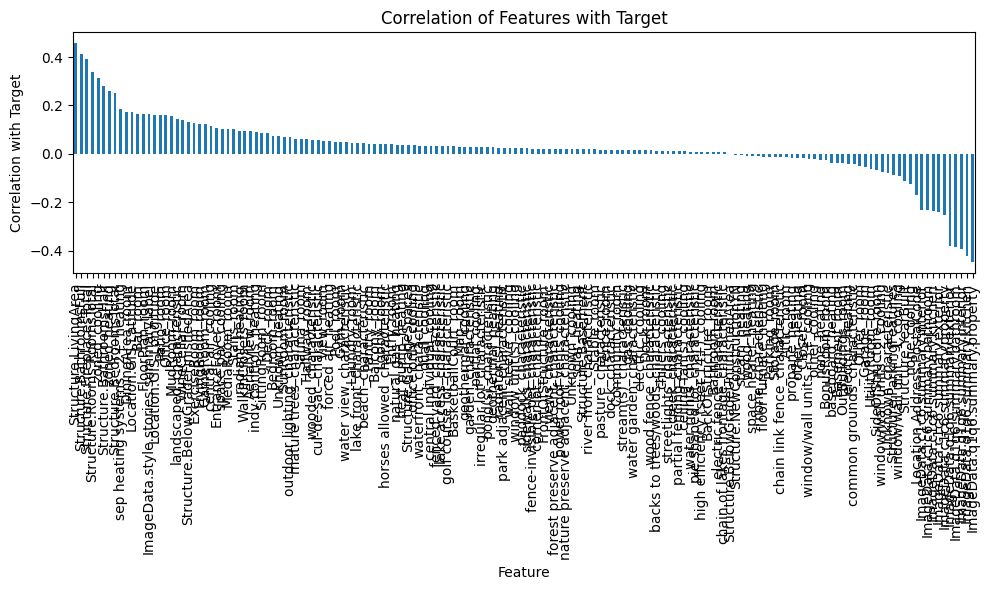

In [59]:
# Hacer analisi bivariable de las variables de entrada con la variable de salida

# Seleccionar las variables de entrada y la variable de salida
X_train = train.drop("Listing.Price.ClosePrice", axis=1)
y_train = train["Listing.Price.ClosePrice"]

X_val = valid.drop("Listing.Price.ClosePrice", axis=1)
y_val = valid["Listing.Price.ClosePrice"]

# Seleccionar solo las variables numéricas
X_train_num = X_train.select_dtypes(exclude=['object'])
X_val_num = X_val.select_dtypes(exclude=['object'])

# Calcular la correlación entre las variables numéricas y la variable de salida
correlations = X_train_num.corrwith(y_train)
correlations = correlations.sort_values(ascending=False)

# Mostrar las 10 variables más correlacionadas
print('correlaciones numericas mas correlacionadas')
print(correlations.head(10), '\n')

# Mostrar las 10 variables menos correlacionadas
print('correlaciones numericas menos correlacionadas')
print(correlations.tail(10))

# Grafiar las correlaciones
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
correlations.plot(kind='bar')
plt.xlabel('Feature')
plt.ylabel('Correlation with Target')
plt.title('Correlation of Features with Target')
plt.tight_layout()
plt.show()


In [61]:
!pip install seaborn

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\FX517\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


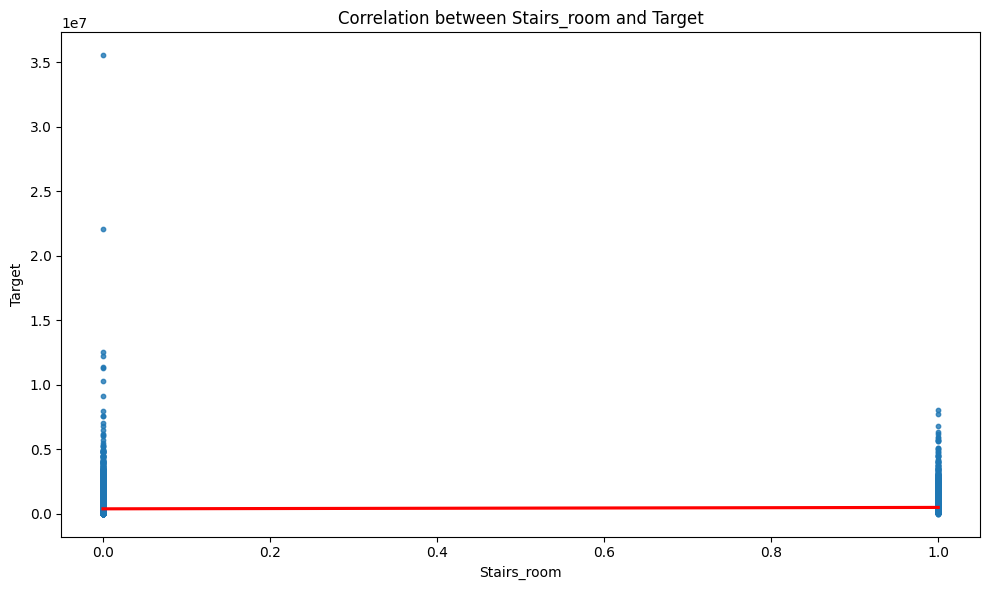

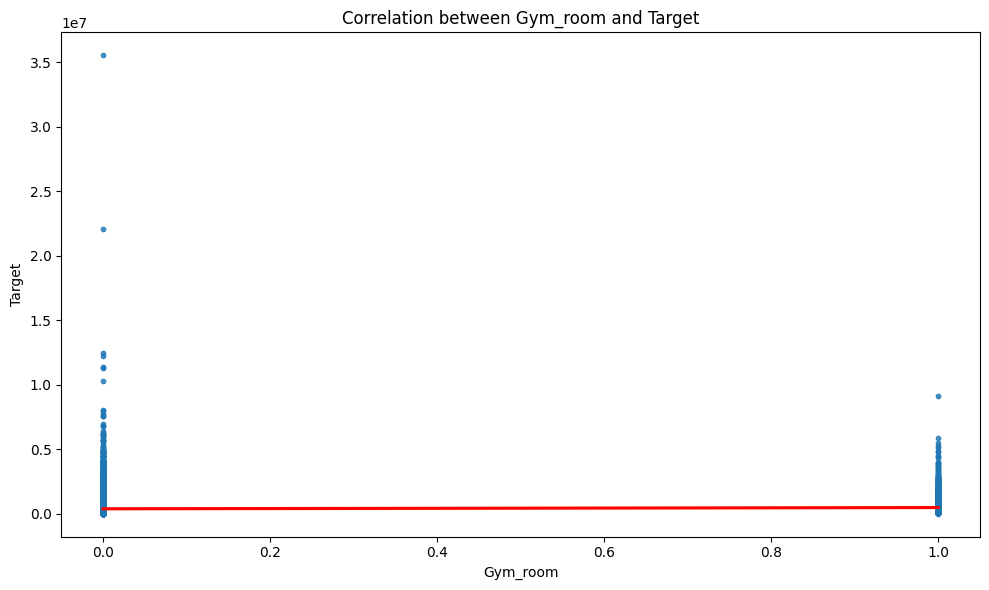

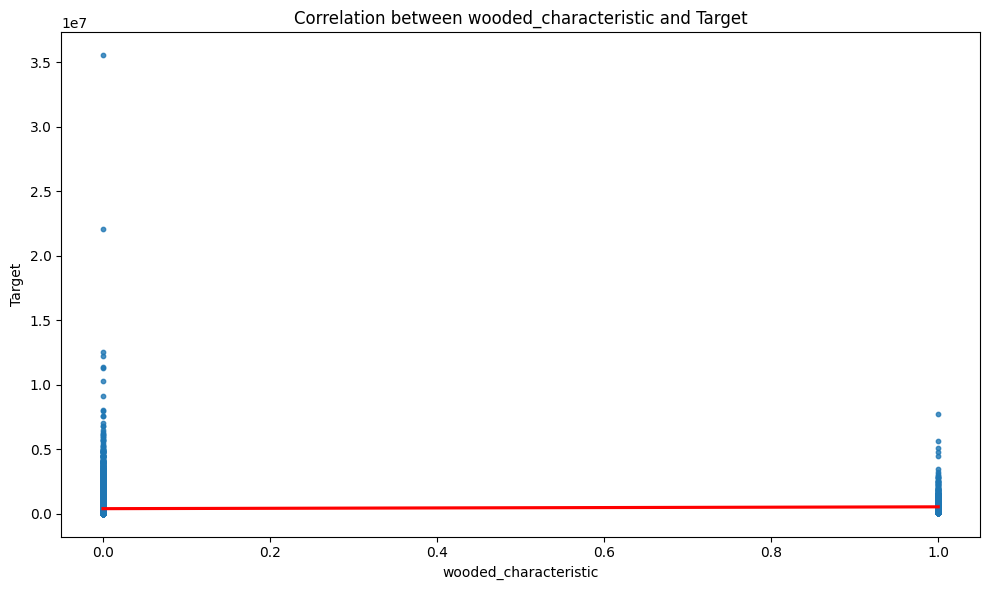

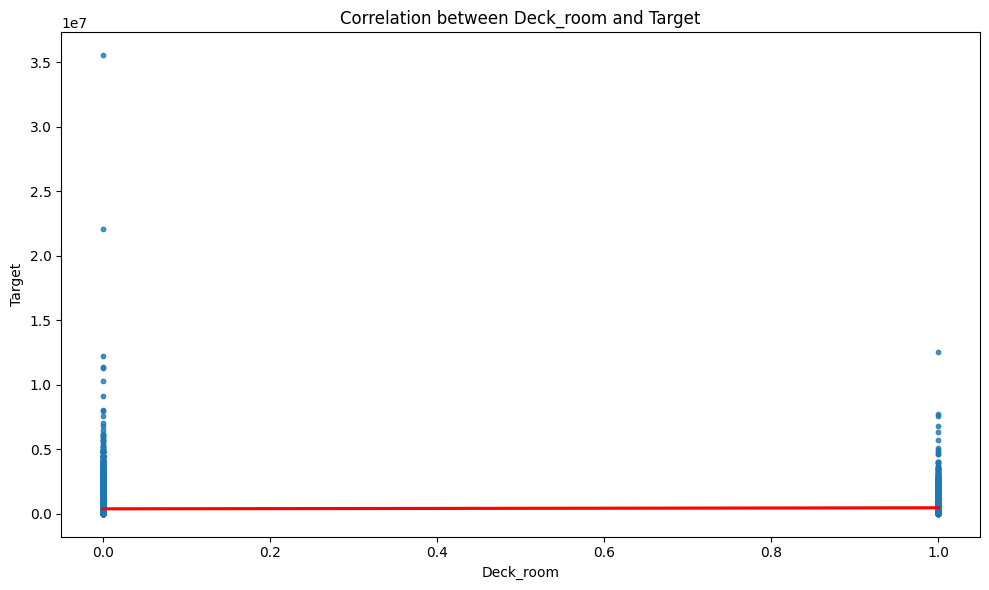

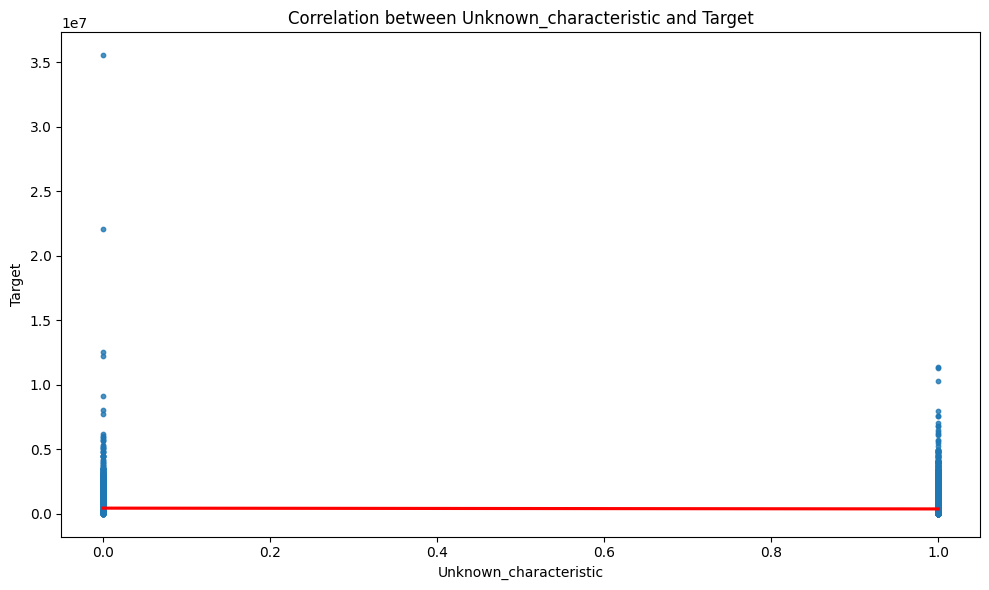

...

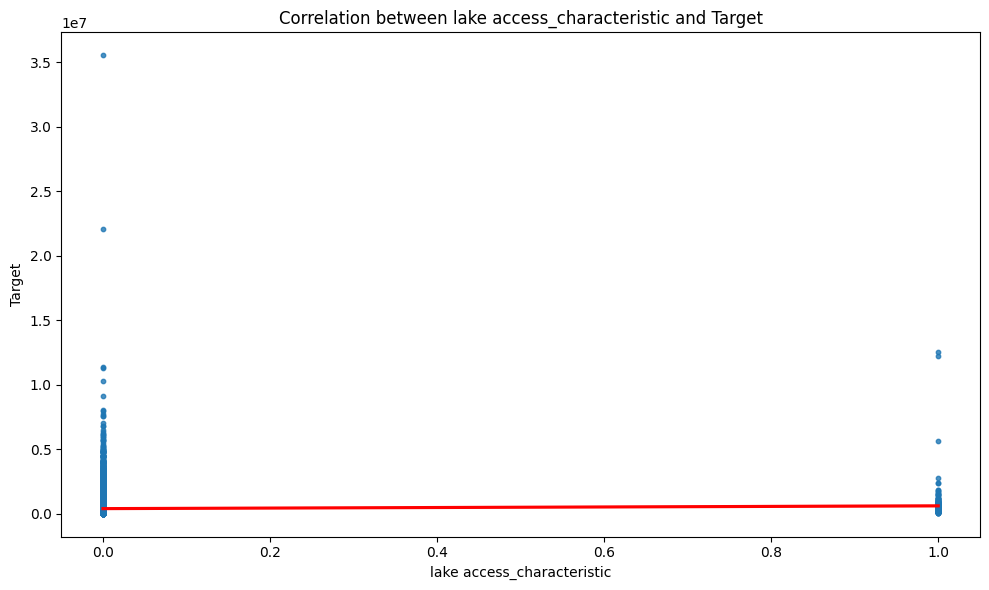

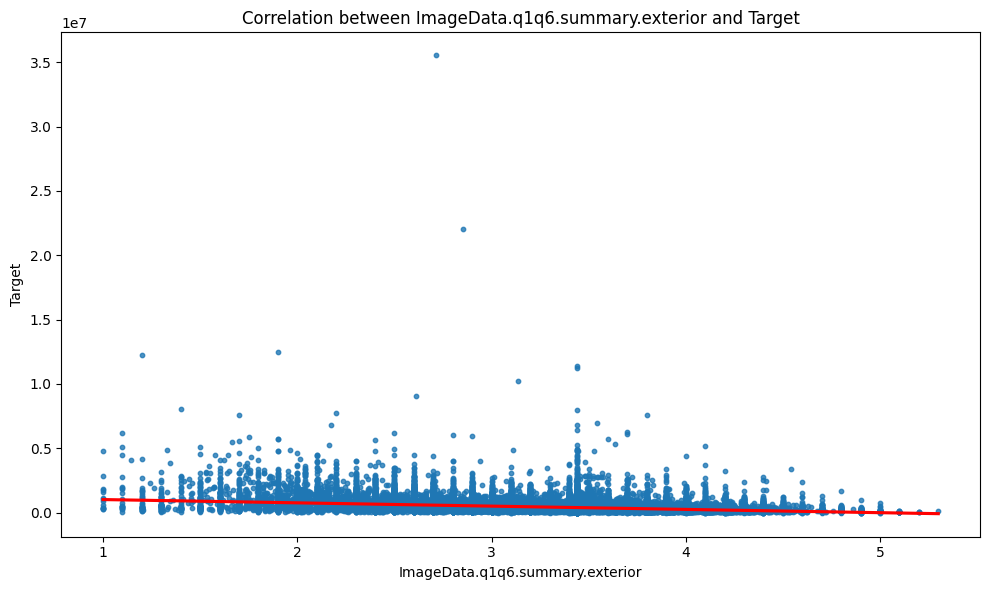

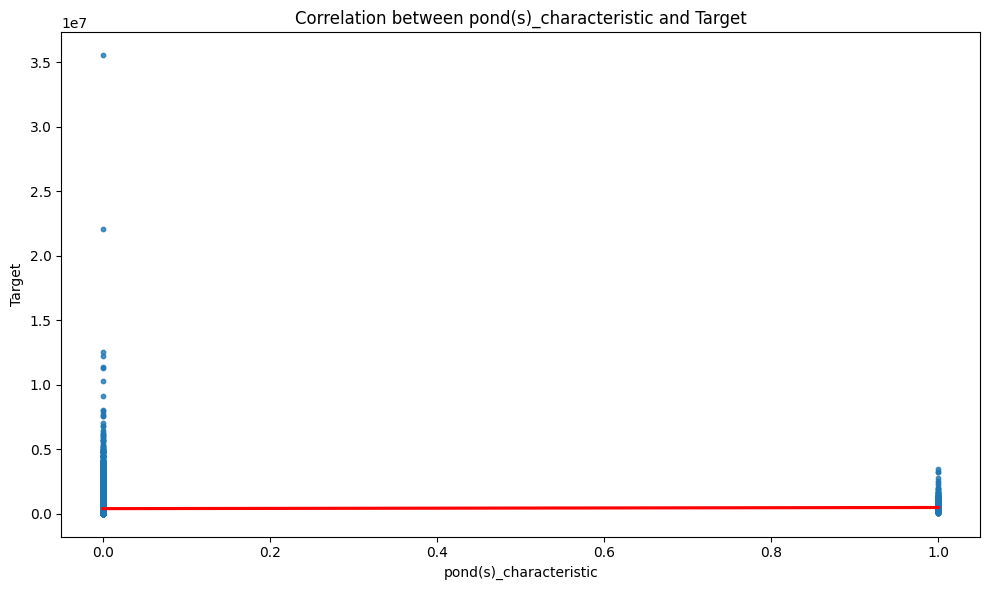

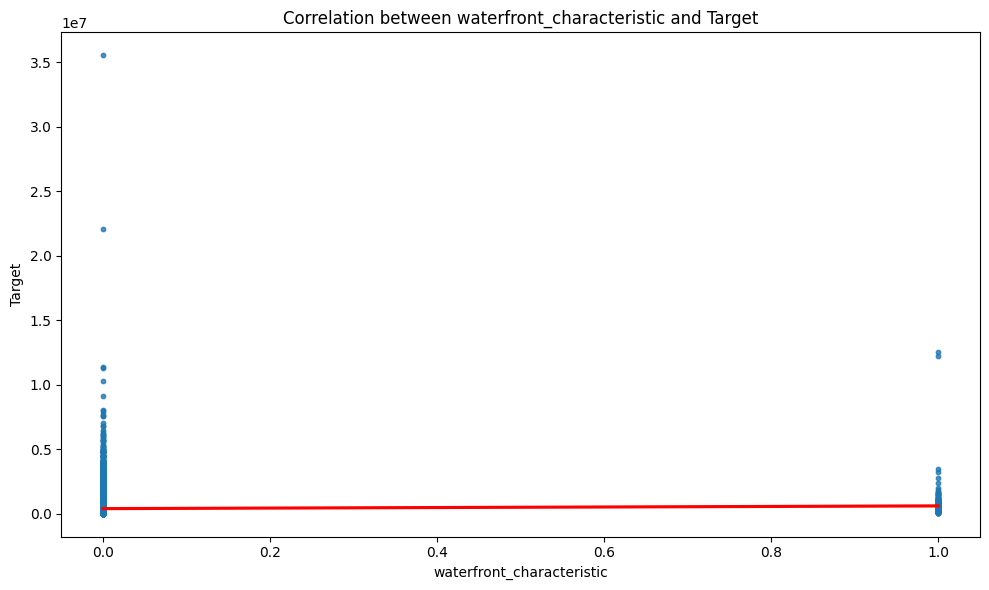

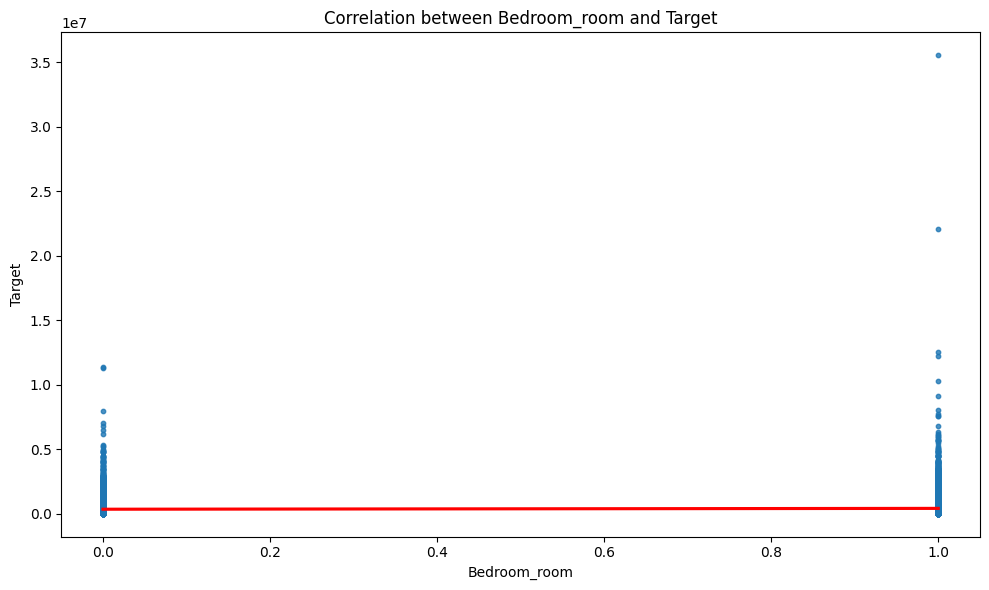

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns

# Iterar a través de las variables numéricas para crear un gráfico de correlación
for feature in X_train_num.columns:
    plt.figure(figsize=(10, 6))
    sns.regplot(x=X_train_num[feature], y=y_train, scatter_kws={'s': 10}, line_kws={'color': 'red'})
    plt.title(f'Correlation between {feature} and Target')
    plt.xlabel(feature)
    plt.ylabel('Target')
    plt.tight_layout()
    plt.show()


## Analisi de Outliers

Outliers en la variable Stairs_room:
  Límite inferior: 0.0
  Límite superior: 0.0
  Total de outliers: 13108

Outliers en la variable Gym_room:
  Límite inferior: 0.0
  Límite superior: 0.0
  Total de outliers: 3498

Outliers en la variable wooded_characteristic:
  Límite inferior: 0.0
  Límite superior: 0.0
  Total de outliers: 2256

Outliers en la variable Deck_room:
  Límite inferior: 0.0
  Límite superior: 0.0
  Total de outliers: 18410

Outliers en la variable Unknown_characteristic:
  Límite inferior: -1.5
  Límite superior: 2.5
  Total de outliers: 0

Outliers en la variable Parking_room:
  Límite inferior: 0.0
  Límite superior: 0.0
  Total de outliers: 716

Outliers en la variable DiningArea_room:
  Límite inferior: -1.5
  Límite superior: 2.5
  Total de outliers: 0

Outliers en la variable Storage_room:
  Límite inferior: 0.0
  Límite superior: 0.0
  Total de outliers: 1862

Outliers en la variable FloorPlan_room:
  Límite inferior: -1.5
  Límite superior: 2.5
  Total de out

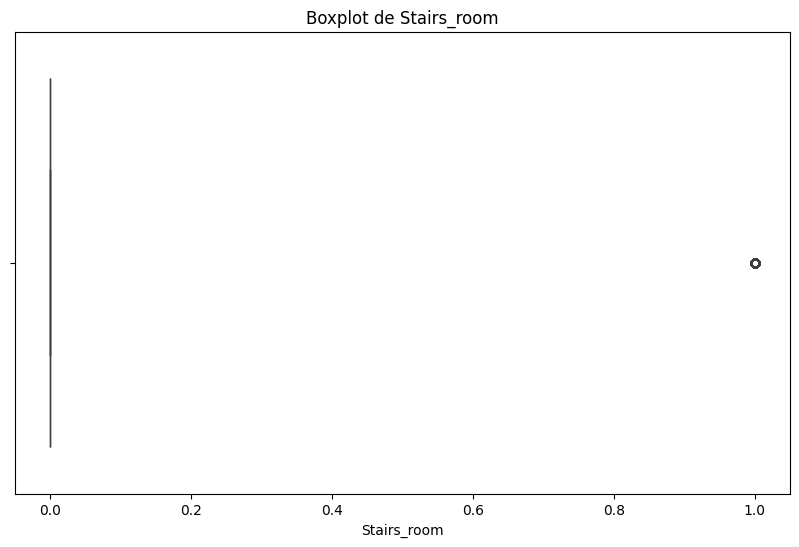

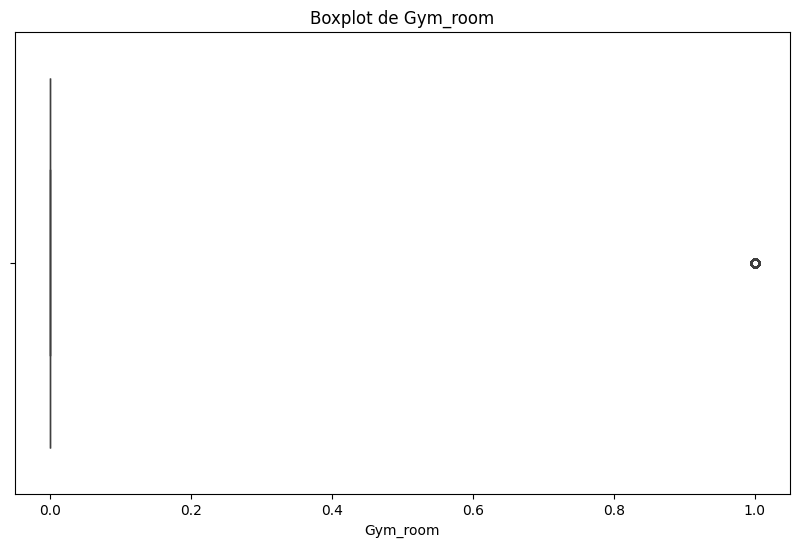

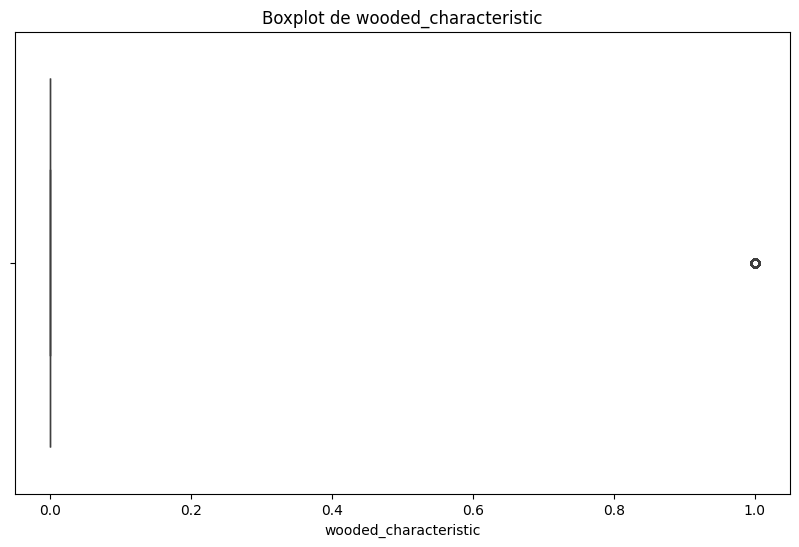

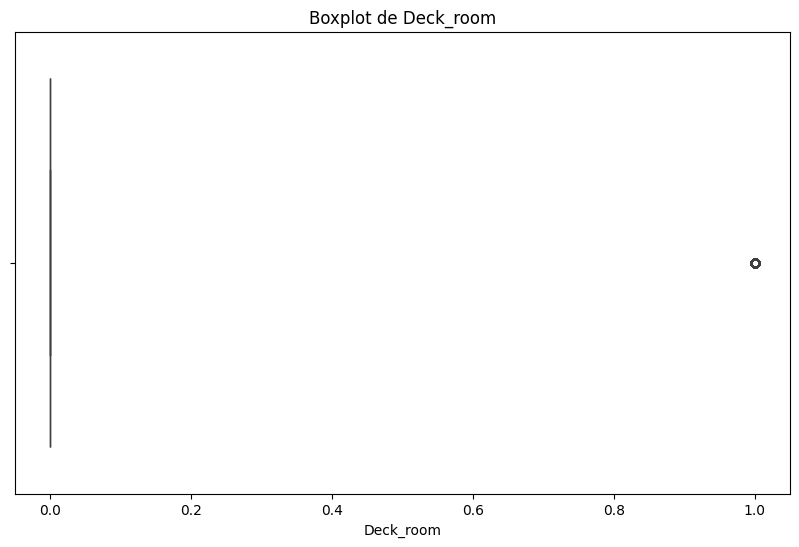

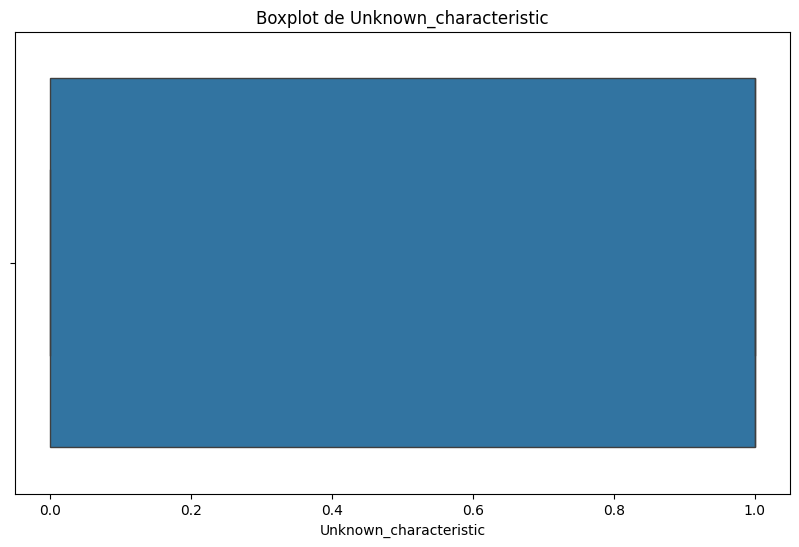

...

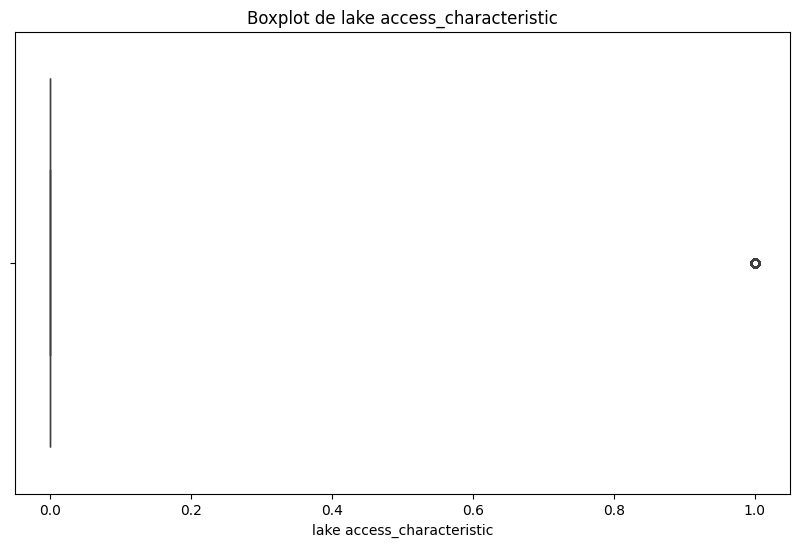

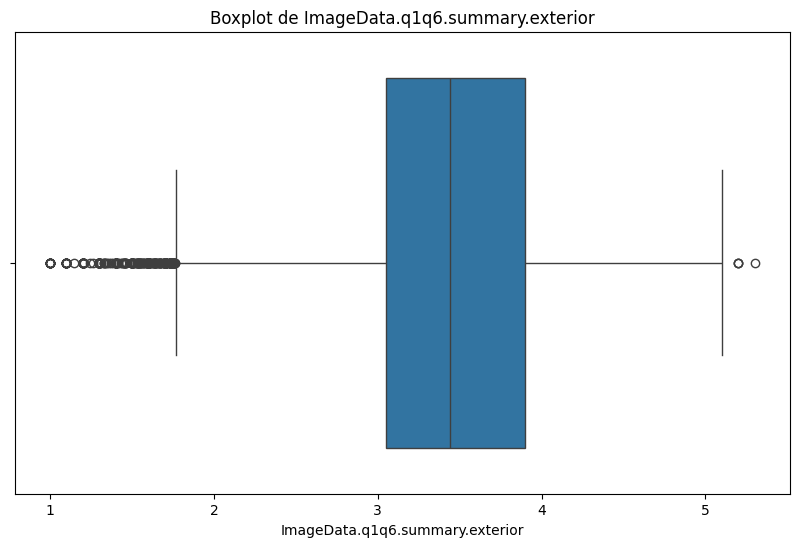

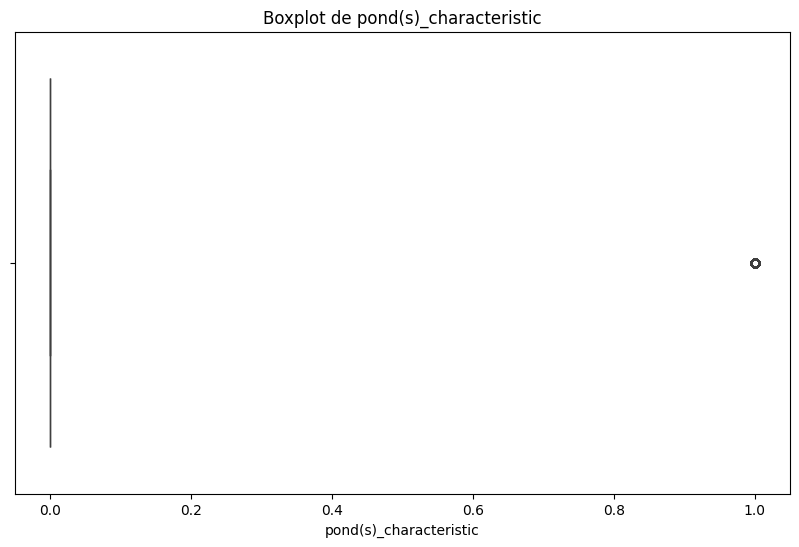

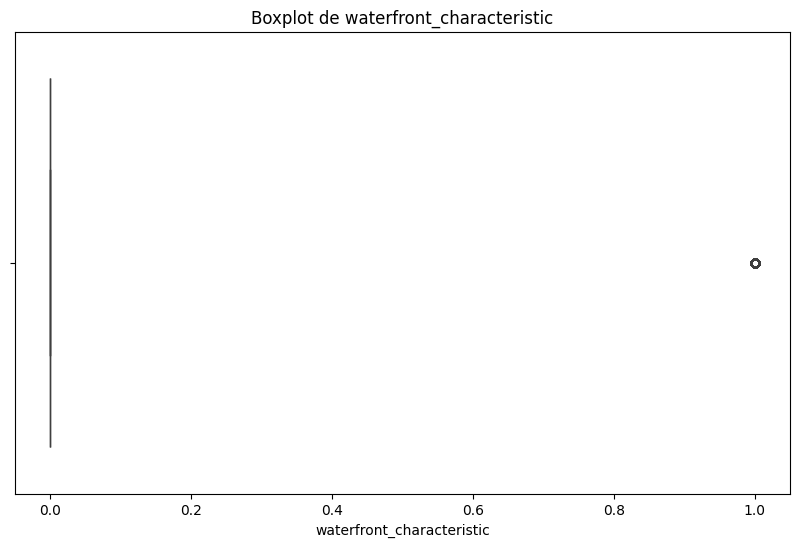

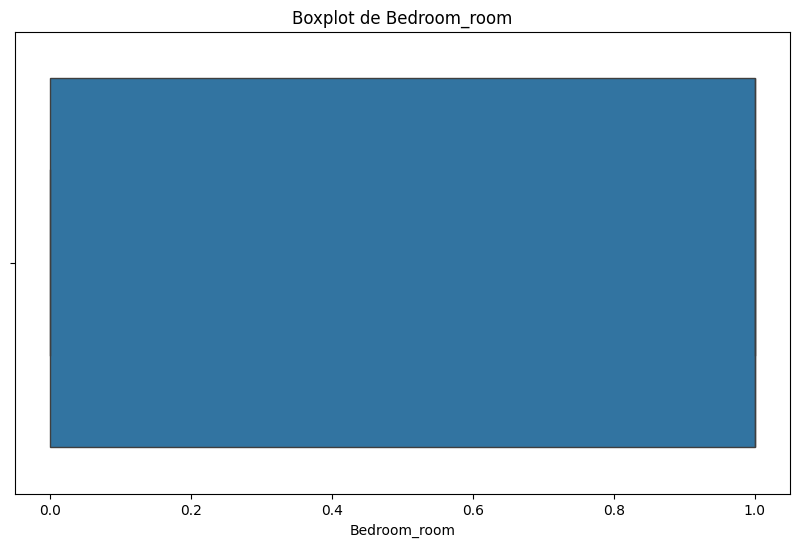

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar solo las variables numéricas
X_train_num = X_train.select_dtypes(exclude=['object'])

# Definir una función para detectar outliers usando el rango intercuartílico (IQR)
def detect_outliers(df):
    outliers = {}
    for column in df.columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[column] = {
            'lower_bound': lower_bound,
            'upper_bound': upper_bound,
            'outliers': df[(df[column] < lower_bound) | (df[column] > upper_bound)][column]
        }
    return outliers

# Detectar outliers en las variables numéricas
outliers = detect_outliers(X_train_num)

# Mostrar outliers por variable
for column, values in outliers.items():
    print(f"Outliers en la variable {column}:")
    print(f"  Límite inferior: {values['lower_bound']}")
    print(f"  Límite superior: {values['upper_bound']}")
    print(f"  Total de outliers: {len(values['outliers'])}")
    print()

# Crear un boxplot para cada variable por separado
for column in X_train_num.columns:
    plt.figure(figsize=(10, 6))  # Aumentar el tamaño de cada gráfico
    sns.boxplot(x=X_train_num[column])
    plt.title(f'Boxplot de {column}')
    plt.xlabel(column)
    plt.show()  # Mostrar el boxplot de cada variable por separado


## Train Xarxa Neuronal

In [76]:
!pip install category_encoders

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\FX517\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [85]:
import numpy as np
import pandas as pd
from sklearn.discriminant_analysis import StandardScaler
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import category_encoders as ce
from tqdm import tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

cols_categorical = train.select_dtypes(include=['object']).columns

encoder = ce.BinaryEncoder(cols=cols_categorical)
X_train_encoded = encoder.fit_transform(train)
X_val_encoded = encoder.transform(valid)

# Escalar las características numéricas (si es necesario)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_val_scaled = scaler.transform(X_val_encoded)

# Definir el modelo de red neuronal
class HousePricePredictor(nn.Module):
    def __init__(self):
        super(HousePricePredictor, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(362, 256),  # 10 características de entrada
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(64, 32),
            nn.Linear(32, 1)  # 1 salida (precio de la casa)
        )
    
    def forward(self, x):
        return self.model(x)

# Crear el modelo
model = HousePricePredictor().to(device)

# Definir la función de pérdida y el optimizador
criterion = nn.MSELoss()  # Para regresión utilizamos MSE
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Función para calcular RMSE y R²
def calculate_metrics(y_true, y_pred):
    y_true = y_true.detach().numpy()
    y_pred = y_pred.detach().numpy()
    
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    return rmse, r2

X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).reshape(-1, 1).to(device)

X_test_tensor = torch.tensor(X_val_scaled, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_val.values, dtype=torch.float32).reshape(-1, 1).to(device)

# Entrenamiento del modelo
epochs = 10
for epoch in tqdm(range(epochs)):
    # Entrenamiento
    model.train()
    optimizer.zero_grad()
    
    # Forward pass
    y_pred_train = model(X_train_tensor)
    
    # Calcular la pérdida
    loss = criterion(y_pred_train, y_train_tensor)
    
    # Backward pass y optimización
    loss.backward()
    optimizer.step()
    
    # Validación
    model.eval()
    with torch.no_grad():
        y_pred_test = model(X_test_tensor)
        rmse, r2 = calculate_metrics(y_test_tensor, y_pred_test)
    
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}, RMSE: {rmse:.4f}, R2: {r2:.4f}')

# Evaluar el modelo con el conjunto de prueba
model.eval()
with torch.no_grad():
    y_pred_test = model(X_test_tensor)
    rmse, r2 = calculate_metrics(y_test_tensor, y_pred_test)

print(f'Final RMSE: {rmse:.4f}')
print(f'Final R2: {r2:.4f}')

 20%|██        | 2/10 [00:00<00:01,  5.07it/s]

Epoch [1/10], Loss: 304966795264.0000, RMSE: 542831.4375, R2: -1.1334
Epoch [2/10], Loss: 304966762496.0000, RMSE: 542831.4375, R2: -1.1334


 40%|████      | 4/10 [00:00<00:01,  5.38it/s]

Epoch [3/10], Loss: 304966729728.0000, RMSE: 542831.3125, R2: -1.1334
Epoch [4/10], Loss: 304966664192.0000, RMSE: 542831.3125, R2: -1.1334


 60%|██████    | 6/10 [00:01<00:00,  5.47it/s]

Epoch [5/10], Loss: 304966631424.0000, RMSE: 542831.1875, R2: -1.1334
Epoch [6/10], Loss: 304966533120.0000, RMSE: 542831.1250, R2: -1.1334


 80%|████████  | 8/10 [00:01<00:00,  5.44it/s]

Epoch [7/10], Loss: 304966434816.0000, RMSE: 542831.0000, R2: -1.1334
Epoch [8/10], Loss: 304966336512.0000, RMSE: 542830.8750, R2: -1.1334


100%|██████████| 10/10 [00:01<00:00,  5.33it/s]

Epoch [9/10], Loss: 304966172672.0000, RMSE: 542830.6875, R2: -1.1334
Epoch [10/10], Loss: 304965976064.0000, RMSE: 542830.4375, R2: -1.1334
Final RMSE: 542830.4375
Final R2: -1.1334


## PCA

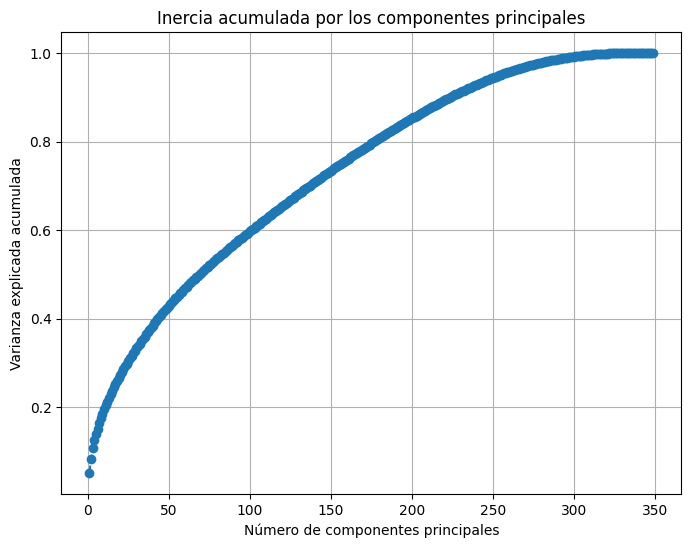

Varianza explicada por cada componente: [5.04097419e-02 3.26494839e-02 2.42916301e-02 1.75145012e-02
 1.36758884e-02 1.25809736e-02 1.21083258e-02 1.12125391e-02
 1.08081574e-02 9.62384500e-03 9.17166505e-03 8.49710348e-03
 8.36454264e-03 8.16752973e-03 7.74342636e-03 7.69179071e-03
 7.47842355e-03 7.22789006e-03 6.98886650e-03 6.76304402e-03
 6.56734287e-03 6.29446172e-03 6.16946229e-03 6.04845431e-03
 5.98043218e-03 5.81555813e-03 5.76000563e-03 5.70785606e-03
 5.64711148e-03 5.64030774e-03 5.52850303e-03 5.43977245e-03
 5.34046995e-03 5.24933330e-03 5.15661319e-03 5.11960715e-03
 5.09738586e-03 4.96400022e-03 4.91260360e-03 4.89979890e-03
 4.83190108e-03 4.70812334e-03 4.61935246e-03 4.58606711e-03
 4.52219273e-03 4.44766408e-03 4.42946329e-03 4.31293694e-03
 4.30669742e-03 4.19227733e-03 4.18641319e-03 4.14182623e-03
 4.00540316e-03 3.98205074e-03 3.92815863e-03 3.89189571e-03
 3.85595916e-03 3.80549050e-03 3.77025450e-03 3.75341788e-03
 3.71421720e-03 3.67593971e-03 3.63753055e-03

In [5]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

X_train_numerical = train.select_dtypes(include=['float64', 'int64'])
X_train_numerical = X_train_numerical.drop("Listing.Price.ClosePrice", axis=1)

X_val_numerical = valid.select_dtypes(include=['float64', 'int64'])
X_val_numerical = X_val_numerical.drop("Listing.Price.ClosePrice", axis=1)

# Escalar las características (es recomendable para PCA)
scaler = StandardScaler()
X_train_scaled_numerical = scaler.fit_transform(X_train_numerical)
X_val_scaled_numerical = scaler.transform(X_val_numerical)

# Inicializar PCA y ajustar los datos escalados
pca = PCA()
pca.fit_transform(X_train_scaled_numerical)
pca.transform(X_val_scaled_numerical)

# Calcular la varianza explicada por cada componente (inercia)
explained_variance_ratio = pca.explained_variance_ratio_

# Calcular la inercia (varianza total explicada por los componentes)
inertia = explained_variance_ratio.cumsum()

# Graficar la inercia acumulada (varianza explicada)
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(inertia) + 1), inertia, marker='o', linestyle='--')
plt.title('Inercia acumulada por los componentes principales')
plt.xlabel('Número de componentes principales')
plt.ylabel('Varianza explicada acumulada')
plt.grid(True)
plt.show()

# Si quieres ver la varianza explicada por cada componente
print("Varianza explicada por cada componente:", explained_variance_ratio)


In [150]:
# Seleccionar el número de componentes que expliquen al menos el 90% de la varianza
explained_variance_threshold = 0.80
num_components = np.argmax(inertia >= explained_variance_threshold) + 1

# Redefinir PCA con el número seleccionado de componentes
pca = PCA(n_components=num_components)

# Ajustar y transformar los datos de entrenamiento
X_pca_train = pca.fit_transform(X_train_scaled_numerical)
X_pca_val = pca.transform(X_val_scaled_numerical)

# Ahora X_pca tiene la misma cantidad de muestras pero con menos características
print(f"Número de componentes seleccionados: {num_components}")


Número de componentes seleccionados: 98


In [126]:
!pip install prince

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/658.1 kB ? eta -:--:--
   --------------------------------------- 658.1/658.1 kB 26.4 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\FX517\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


## Escalamos las variables

In [ ]:
# scalar las variables numericas
from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train_encoded)
# X_val_scaled = scaler.transform(X_val_encoded)
# X_test_scaled = scaler.transform(X_test_encoded)

ValueError: could not convert string to float: '61068-1533'

## Transformer Forecasting

In [40]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/390.3 MB ? eta -:--:--
   ---------------------------------------- 1.8/390.3 MB 11.2 MB/s eta 0:00:35
    --------------------------------------- 5.0/390.3 MB 13.7 MB/s eta 0:00:29
    --------------------------------------- 7.9/390.3 MB 13.9 MB/s eta 0:00:28
   - -------------------------------------- 10.7/390.3 MB 14.3 MB/s eta 0:00:27
   - -------------------------------------- 13.4/390.3 MB 13.7 MB/s eta 0:00:28
   - -------------------------------------- 16.8/390.3 MB 14.3 MB/s eta 0:00:27
   -- ------------------------------------- 21.0/390.3 MB 15.2 MB/s eta 0:00:25
   -- ------------------------------------- 23.9/390.3 MB 15.3 MB/s eta 0:00:25
   -- ------------------------------------- 27.0/390.3 MB 15.1 MB/s eta 0:00:24
   --- ------------------------------------ 29.9/390.3 MB 15.0 MB/s eta 0:00:24
   --- ------------------------------------ 33.6/390.3


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\FX517\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [54]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LayerNormalization, MultiHeadAttention, Dropout, Reshape
from tensorflow.keras import backend as K

def create_transformer(input_shape, num_heads=4, embed_dim=64):
    # Entrada
    inputs = Input(shape=(input_shape,))
    
    # Añadimos una dimensión extra usando Reshape para que la forma sea (batch_size, 1, num_features)
    x = Reshape((1, input_shape))(inputs)
    
    # Capa densa de embedding
    x = Dense(embed_dim)(x)
    
    # Atención multi-cabeza
    attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x, x)
    
    # Normalización de capa
    x = LayerNormalization()(attn_output + x)
    
    # Capa densa y activación
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # Capa de salida para regresión
    outputs = Dense(1)(x)
    
    # Modelo
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mse')  # Usamos MSE para regresión
    return model

# Supongamos que X_train_scaled es tu conjunto de datos de entrenamiento
input_shape = X_train_scaled.shape[1]  # Número de características (sin batch_size)

transformer = create_transformer(input_shape)

# Entrenamos el modelo
transformer.fit(X_train_scaled, y_train, epochs=10, batch_size=32, validation_data=(X_val_scaled, y_val))

# Evaluar el modelo
y_pred = transformer.predict(X_val_scaled)

# Aplanar y_pred para asegurarnos de que tiene la forma correcta
y_pred = y_pred.flatten()

# Métricas de evaluación
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

rmse = np.sqrt(mean_squared_error(y_val, y_pred))
r2 = r2_score(y_val, y_pred)
mae = mean_absolute_error(y_val, y_pred)

print(f'RMSE: {rmse:.4f}')
print(f'R2: {r2:.4f}')
print(f'MAE: {mae:.4f}')


Epoch 1/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 23s 8ms/step - loss: 296314175488.0000 - val_loss: 188291022848.0000
Epoch 2/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 190726422528.0000 - val_loss: 130672508928.0000
Epoch 3/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 150371041280.0000 - val_loss: 120322940928.0000
Epoch 4/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 128020905984.0000 - val_loss: 118418120704.0000
Epoch 5/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 112922402816.0000 - val_loss: 111042150400.0000
Epoch 6/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 113394458624.0000 - val_loss: 97787846656.0000
Epoch 7/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 125911064576.0000 - val_loss: 83895189504.0000
Epoch 8/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 127802073088.0000 - val_loss: 74057719808.0000
Epoch 9/10
2685/2685 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 148897382400.0000 - val_loss: 66004840448.0000
Epoch 10/10
2

## LGMREGRESSOR

In [32]:
# end mlflow run
mlflow.end_run()

In [37]:
X_train.dtypes

none_characteristic                  int64
Cooling.CeilingFans_features         int64
ImageData.c1c6.summary.exterior    float64
Location.Address.PostalCode          int64
Appliances.RangeHood_features        int64
                                    ...   
ImageData.summary.bathroom         float64
ImageData.summary.kitchen          float64
CloseDate_Month                      int32
CloseDate_Year                       int32
CloseDate_Season                    object
Length: 367, dtype: object

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4155
[LightGBM] [Info] Number of data points in the train set: 85949, number of used features: 338
[LightGBM] [Info] Start training from score 391464.432743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

2024/11/17 12:04:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Top 10 características más importantes:
                             Feature  Importance
309          Kriging_Predicted_Price        2306
181           Location.GIS.Longitude        1959
210            Location.GIS.Latitude        1899
279             Structure.LivingArea        1796
300              Structure.YearBuilt        1618
3        Location.Address.PostalCode        1513
35        Structure.Rooms.RoomsTotal         857
288  ImageData.q1q6.summary.exterior         839
155          Structure.BathroomsFull         807
142          Structure.BedroomsTotal         634
Top 30 características más importantes:
['Kriging_Predicted_Price', 'Location.GIS.Longitude', 'Location.GIS.Latitude', 'Structure.LivingArea', 'Structure.YearBuilt', 'Location.Address.PostalCode', 'Structure.Rooms.RoomsTotal', 'ImageData.q1q6.summary.exterior', 'Structure.BathroomsFull', 'Structure.BedroomsTotal', 'ImageData.summary.kitchen', 'ImageData.summary.exterior', 'ImageData.summary.interior', 'ImageData.summa

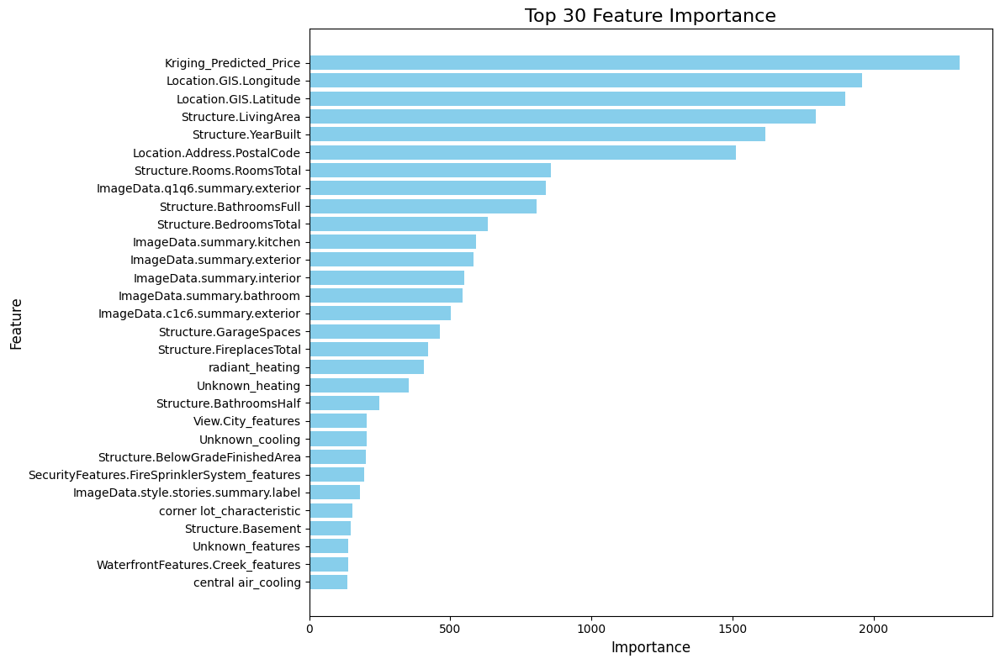

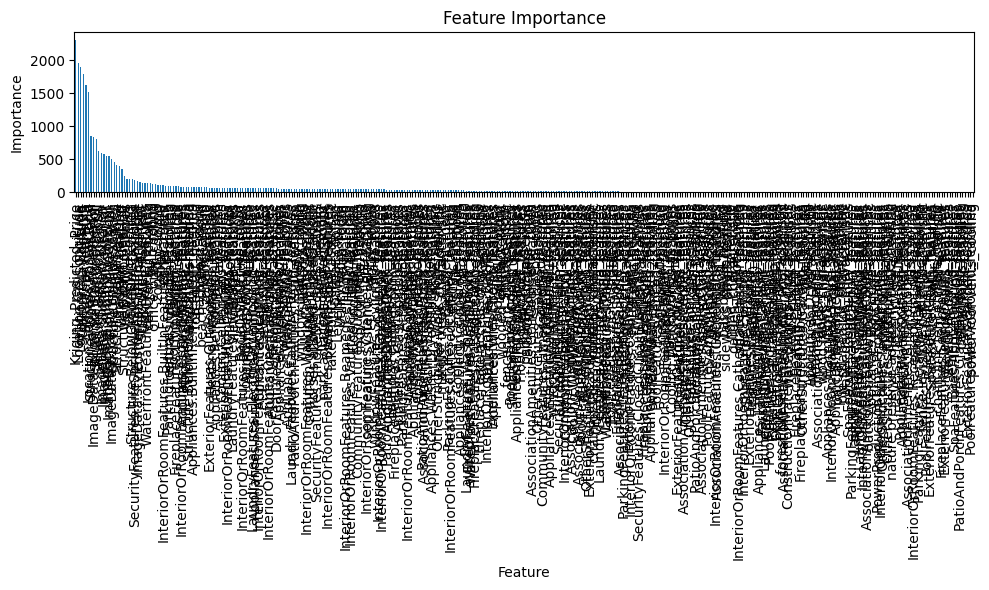

{'train_rmse': 119037.14699244515, 'val_rmse': 171909.61013769254, 'train_r2': 0.906690363385972, 'val_r2': 0.785931546180025}


<Figure size 640x480 with 0 Axes>

In [65]:
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import mlflow
import warnings

# Suprimir todos los warnings
warnings.filterwarnings('ignore', category=UserWarning, module='lightgbm')

mlflow.set_experiment("LightGBM House Price Prediction")
mlflow.start_run()

numeric_features = X_train.select_dtypes(include=['float64', 'int64']).columns # Months are int32, they don't get included

X_valid['Location.Address.PostalCode'] = pd.to_numeric(X_valid['Location.Address.PostalCode'], errors='coerce')


# Define the model
model = LGBMRegressor(
    n_estimators=1000,
    learning_rate=0.1,
    max_depth=7,
    subsample=0.8,
    colsample_bytree=0.8,
    metric='rmse',
    random_state=42,
)

# X_train = train.drop("Listing.Price.ClosePrice", axis=1)
# y_train = train["Listing.Price.ClosePrice"]

# X_val = valid.drop("Listing.Price.ClosePrice", axis=1)
# y_val = valid["Listing.Price.ClosePrice"]

# X_train = X_train_encoded
# X_val = X_val_encoded
# X_test = X_test_encoded

# Train the model
model.fit(X_train[numeric_features], y_train)

# Calculate performance metrics
train_pred = model.predict(X_train[numeric_features])
val_pred = model.predict(X_valid[numeric_features])

metrics = {
    'train_rmse': np.sqrt(mean_squared_error(y_train, train_pred)),
    'val_rmse': np.sqrt(mean_squared_error(y_valid, val_pred)),
    'train_r2': r2_score(y_train, train_pred),
    'val_r2': r2_score(y_valid, val_pred)
}

# Log the model and metrics
mlflow.sklearn.log_model(model, "model")
mlflow.log_metrics(metrics)

# Calcular la importancia de las características
feature_importance = model.feature_importances_

# Crear un DataFrame para las características y su importancia
feature_importance_df = pd.DataFrame({
    'Feature': numeric_features,
    'Importance': feature_importance
})

# Ordenar las características por su importancia
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Mostrar las variables más importantes
top_features = feature_importance_df.head(10)
print("Top 10 características más importantes:")
print(top_features)

# Guardar las 30 variables más importantes en una lista
top_30_features = feature_importance_df.head(30)['Feature'].tolist()

# Imprimir las variables más importantes
print("Top 30 características más importantes:")
print(top_30_features)

# guardar las 30 variables mas importantes en MLflow
top_features = feature_importance_df.head(30)
plt.figure(figsize=(12, 8))
plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.title('Top 30 Feature Importance', fontsize=16)
plt.gca().invert_yaxis()
plt.tight_layout()

# Guardar y mostrar el gráfico
plt.savefig("feature_importance.png")
plt.show()

# Log the feature importance plot to MLflow
mlflow.log_artifact("feature_importance.png")


# log the feature importance
feature_importance = model.feature_importances_
feature_importance = pd.Series(feature_importance, index=numeric_features)
feature_importance = feature_importance.sort_values(ascending=False)

# Plot the feature importance
plt.figure(figsize=(10, 6))
feature_importance.plot(kind='bar')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# log the feature importance plot to MLflow
plt.savefig("feature_importance.png")
mlflow.log_artifact("feature_importance.png")

# End the MLflow run
mlflow.end_run()

print(metrics)


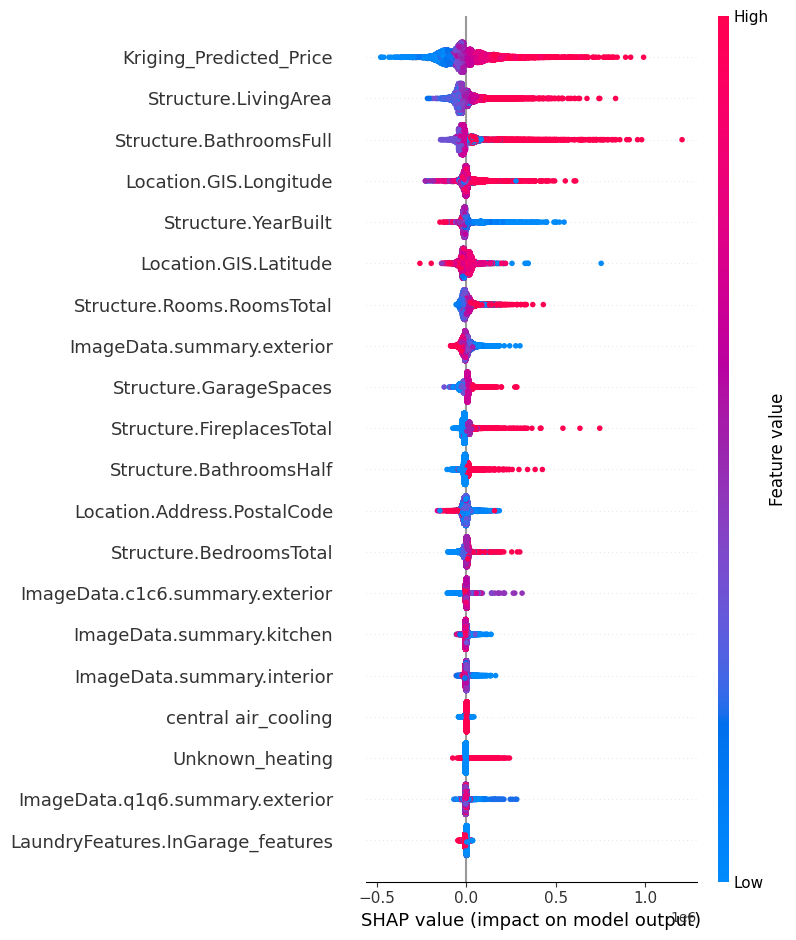

In [66]:
import shap
# Extract the underlying booster model
booster = model.booster_

# Initialize the SHAP explainer with the Booster
explainer = shap.TreeExplainer(booster)

# Calculate SHAP values for a sample of the validation set
shap_values = explainer.shap_values(X_valid[numeric_features])

# Visualize SHAP summary
shap.summary_plot(shap_values, X_valid[numeric_features])


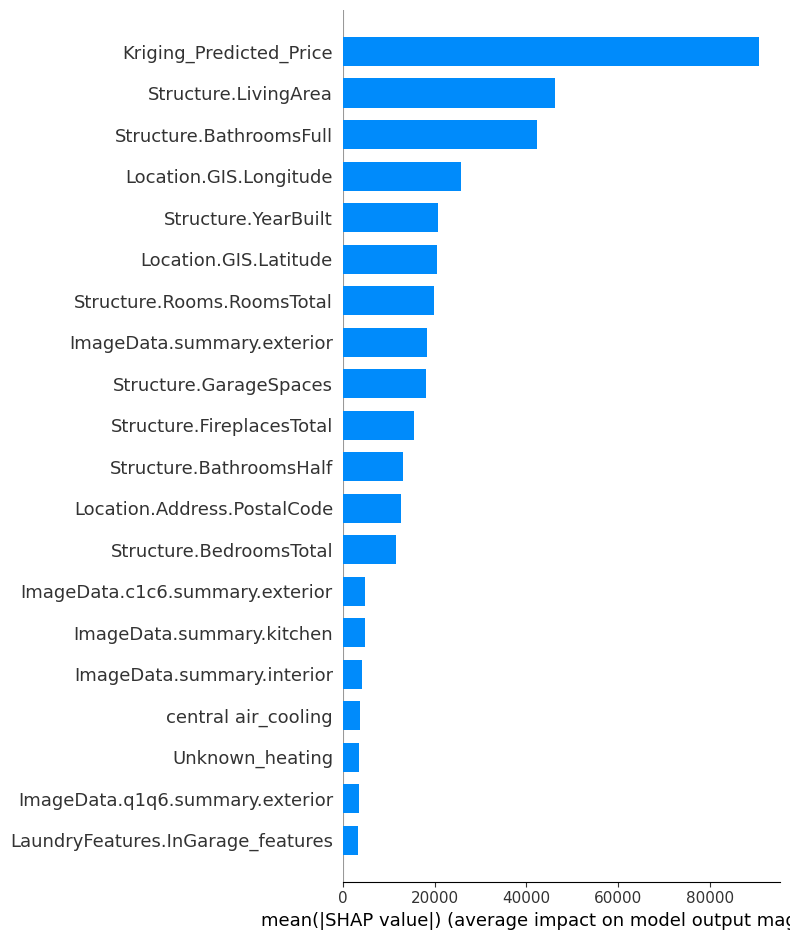

In [69]:
# Visualize a summary bar plot
shap.summary_plot(shap_values, X_valid[numeric_features], plot_type="bar")


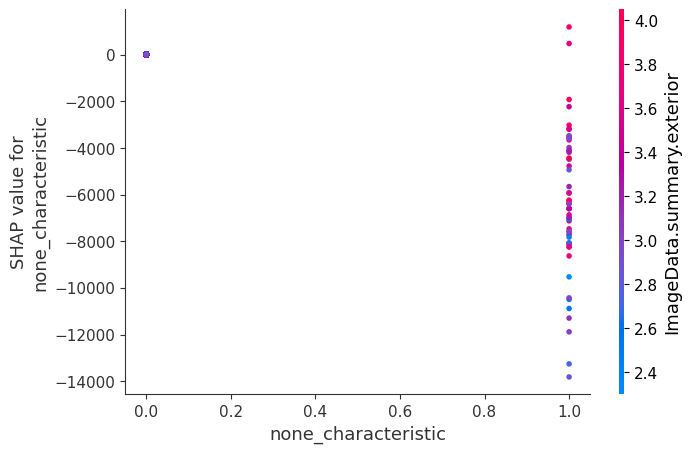

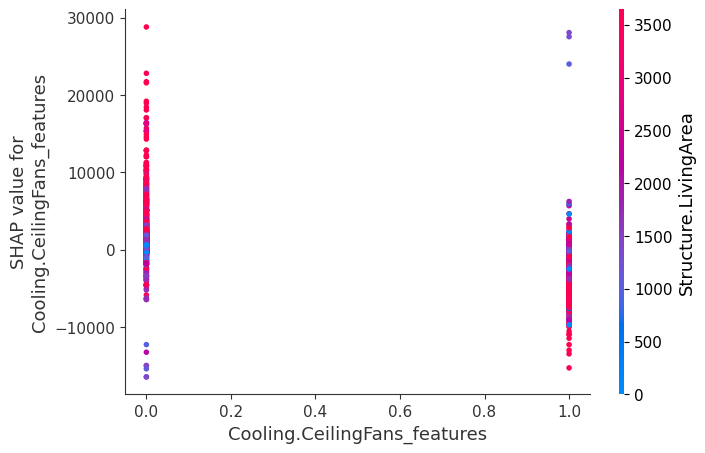

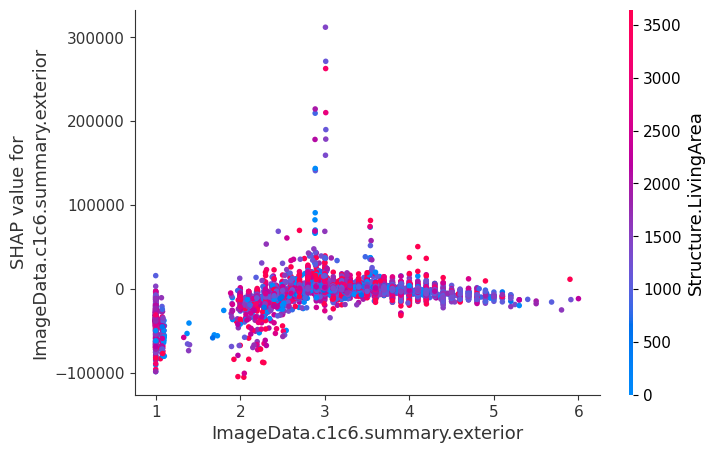

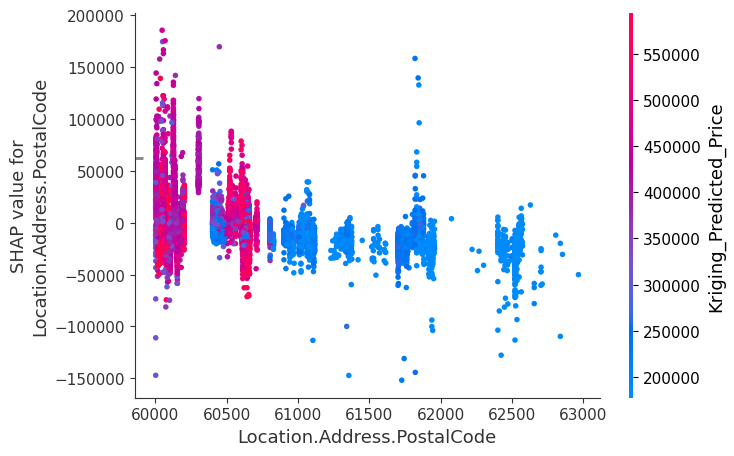

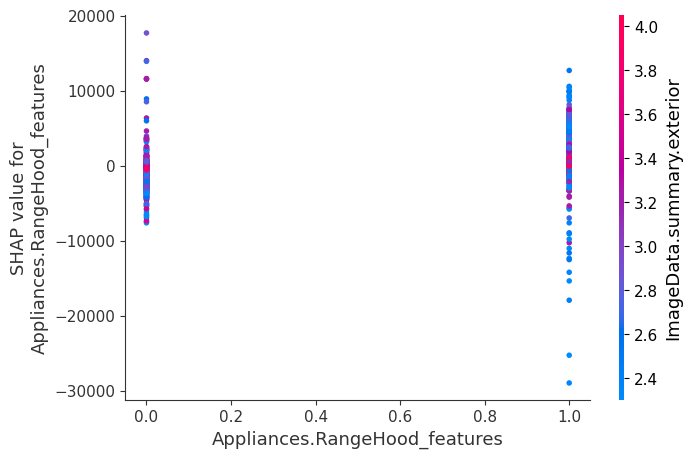

...

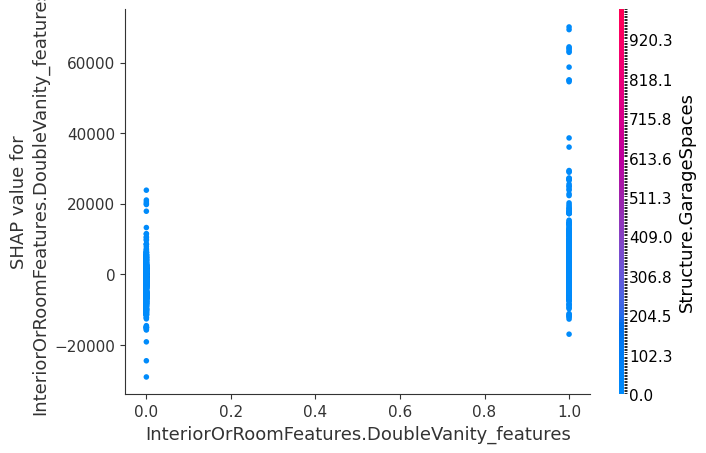

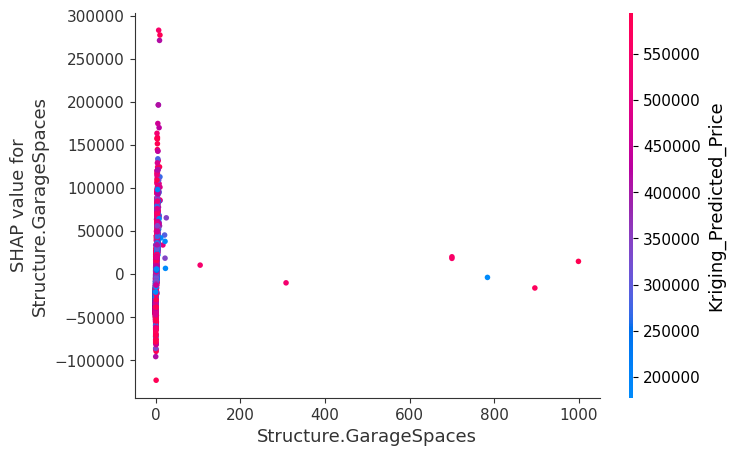

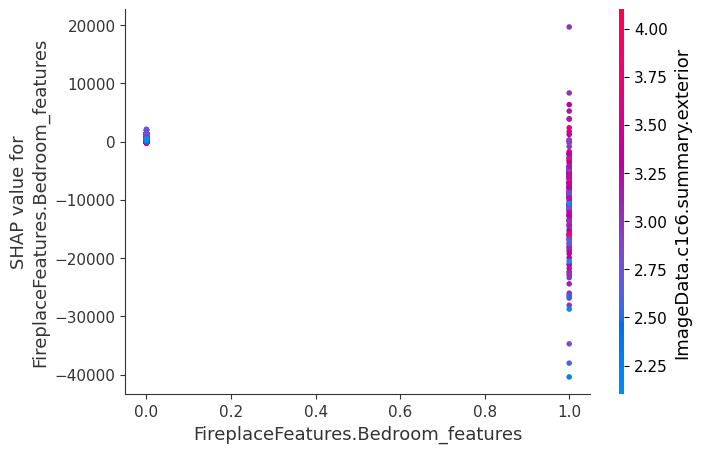

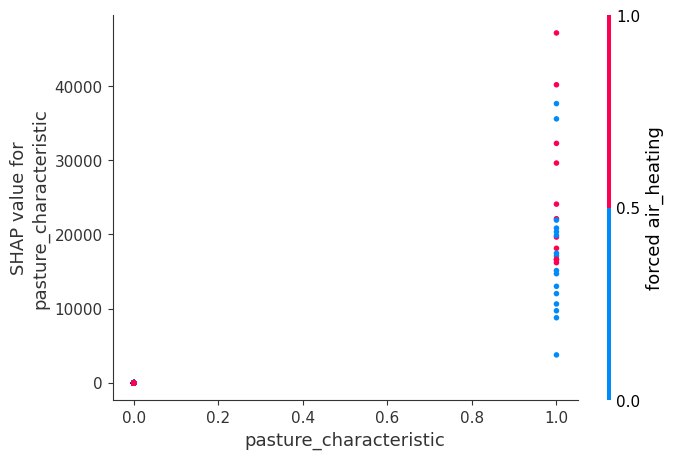

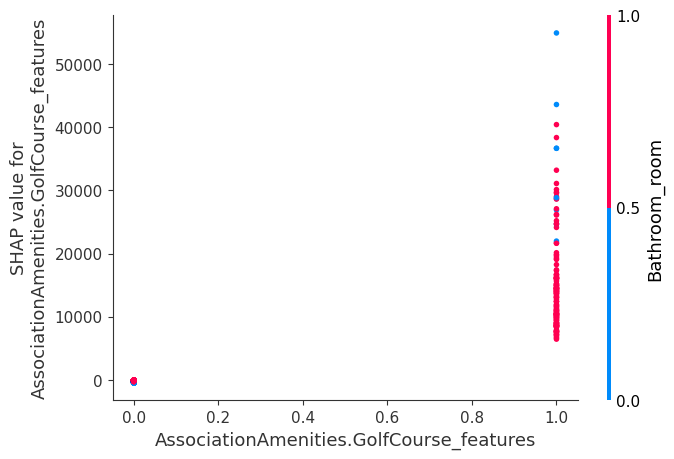

In [ ]:
for feature in numeric_features:
    shap.dependence_plot(feature, shap_values, X_valid[numeric_features])


In [ ]:
# Visualize the SHAP values for the first prediction in the dataset
shap.force_plot(explainer.expected_value, shap_values[0, :], X_valid.iloc[0, :])


In [166]:
'Location.Address.PostalCode' in numeric_features

True

In [26]:
# Convierte la columna 'Location.Address.PostalCode' a numérica
test['Location.Address.PostalCode'] = pd.to_numeric(test['Location.Address.PostalCode'], errors='coerce')

# substituir los valores nulos con la media
test['Location.Address.PostalCode'] = test['Location.Address.PostalCode'].fillna(test['Location.Address.PostalCode'].mean())

# Asegúrate de que las columnas del conjunto de datos sean de tipo numérico
test[numeric_features] = test[numeric_features].apply(pd.to_numeric, errors='coerce')

# Verifica los tipos de datos
print(test.dtypes)

# Realiza la predicción
test_pred = model.predict(test[numeric_features])

# Guarda las predicciones
test_predictions = pd.DataFrame({
    'Listing.ListingId': test['Listing.ListingId'],
    'Listing.Price.ClosePrice': test_pred
})


none_characteristic                         int64
Cooling.CeilingFans_features                int64
ImageData.c1c6.summary.exterior           float64
Location.Address.PostalCode               float64
Appliances.RangeHood_features               int64
                                           ...   
InteriorOrRoomFeatures.WetBar_features      int64
ImageData.summary.exterior                float64
ImageData.summary.interior                float64
ImageData.summary.bathroom                float64
ImageData.summary.kitchen                 float64
Length: 364, dtype: object


In [28]:
test_predictions.shape

(22039, 2)

In [27]:
# Guarda las predicciones en un archivo CSV
test_predictions.to_csv("test_predictions.csv", index=False)

In [168]:
test_pred.shape

(22039,)

In [166]:
# end the MLflow run
mlflow.end_run()

In [7]:
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np


X_train = train.drop("Listing.Price.ClosePrice", axis=1)
y_train = train["Listing.Price.ClosePrice"]

X_val = valid.drop("Listing.Price.ClosePrice", axis=1)
y_val = valid["Listing.Price.ClosePrice"]

numeric_features = X_train.select_dtypes(include=['float64', 'int64']).columns

# normalizar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[numeric_features])
X_val_scaled = scaler.transform(X_val[numeric_features])


# Entrenar el primer modelo (Modelo 1)
model1 = LGBMRegressor(
    n_estimators=1000,
    learning_rate=0.1,
    max_depth=7,
    subsample=0.8,
    colsample_bytree=0.8,
    metric='rmse',
    random_state=42,
)

model1.fit(X_train_scaled, y_train)

# Entrenar el segundo modelo (Modelo 2)
model2 = LGBMRegressor(
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=7,
    subsample=0.8,
    colsample_bytree=0.8,
    metric='rmse',
    random_state=42,
)

model2.fit(X_train[numeric_features], y_train)

# Realizar predicciones con ambos modelos
pred1 = model1.predict(X_val_scaled)
pred2 = model2.predict(X_val_scaled)

# Promediar las predicciones
final_pred = (pred1 + pred2) / 2

# Evaluar el rendimiento
mse = mean_squared_error(y_val, final_pred)
r2 = r2_score(y_val, final_pred)

print(f'Mean Squared Error: {mse}')
print(f'R2 Score: {r2}')


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020962 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4275
[LightGBM] [Info] Number of data points in the train set: 85900, number of used features: 337
[LightGBM] [Info] Start training from score 391411.550813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

In [136]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# Definir los modelos base
base_learners = [
    ('lgbm1', LGBMRegressor(n_estimators=1000, learning_rate=0.1, max_depth=7, subsample=0.8, colsample_bytree=0.8, random_state=42)),
    ('lgbm2', LGBMRegressor(n_estimators=1000, learning_rate=0.05, max_depth=7, subsample=0.8, colsample_bytree=0.8, random_state=42)),
]

# Definir el modelo de apilamiento
stacking_model = StackingRegressor(
    estimators=base_learners,
    final_estimator=LinearRegression()
)

# Entrenar el modelo de apilamiento
stacking_model.fit(X_train_scaled, y_train)

# Realizar predicciones
stacking_pred = stacking_model.predict(X_val_scaled)

# Evaluar el rendimiento
mse = mean_squared_error(y_val, stacking_pred)
r2 = r2_score(y_val, stacking_pred)

print(f'Mean Squared Error: {mse}')
print(f'R2 Score: {r2}')


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4627
[LightGBM] [Info] Number of data points in the train set: 85900, number of used features: 157
[LightGBM] [Info] Start training from score 391411.550813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

In [114]:
test = pd.read_csv("C:/Users/FX517/OneDrive - Universitat Politècnica de Catalunya/Escritorio/Hackathons/RelsB/data/test_cleaned.csv")

In [116]:
# quedarse con las columnas comunes

train_columns = set(train.columns)
test_columns = set(test.columns)

common_columns = train_columns & test_columns
common_columns = list(common_columns)

test = test[common_columns]

In [118]:
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import mlflow

numeric_features = test.select_dtypes(include=['float64', 'int64']).columns

X_test = test

# Calculate performance metrics
test_pred = model.predict(X_test[numeric_features])

# guardame el resultado en un archivo csv que sea una columna con el id y otra con el resultado
test['Listing.Price.ClosePrice'] = test_pred
test[['Listing.ListingId', 'Listing.Price.ClosePrice']].to_csv("submission.csv", index=False)

print(test_pred)


[350989.26237813 437840.57774149 359546.54406231 ... 279591.44718862
 612807.63256757 994333.92663424]


In [111]:
import warnings
warnings.filterwarnings("ignore")

# end mlflow run
mlflow.end_run()


In [99]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMRegressor

numeric_features = train.select_dtypes(exclude=['object']).columns
numeric_features = numeric_features.drop('Listing.Price.ClosePrice')

X_train = train.drop("Listing.Price.ClosePrice", axis=1)
y_train = train["Listing.Price.ClosePrice"]

X_val = valid.drop("Listing.Price.ClosePrice", axis=1)
y_val = valid["Listing.Price.ClosePrice"]

# Definir el modelo base
model = LGBMRegressor(random_state=42)

# Definir el grid de hiperparámetros para la búsqueda
param_grid = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [5, 7, 10],
    'num_leaves': [31, 63, 127],
    'min_child_samples': [10, 20, 30],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Realizar búsqueda en cuadrícula con validación cruzada
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=1, verbose=2)

grid_search.fit(X_train[numeric_features], y_train)

# Mostrar los mejores parámetros
print(f"Best parameters found: {grid_search.best_params_}")


Fitting 3 folds for each of 2187 candidates, totalling 6561 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4409
[LightGBM] [Info] Number of data points in the train set: 57266, number of used features: 157
[LightGBM] [Info] Start training from score 393408.715101
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
import lightgbm as lgb

# Obtener la importancia de las características
importances = model.feature_importances_

# Crear un DataFrame para las características y sus importancias
feature_importance_df = pd.DataFrame({
    'Feature': numeric_features,
    'Importance': importances
})

# Ordenar por importancia
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualizar las 10 características más importantes
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'][:10], feature_importance_df['Importance'][:10])
plt.xlabel('Importancia')
plt.title('Top 10 Características Más Importantes')
plt.gca().invert_yaxis()
plt.show()

# O utilizar plot_importance directamente
lgb.plot_importance(model, max_num_features=10, importance_type='split', figsize=(10, 6))
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import lightgbm as lgb
import mlflow
import mlflow.pyfunc
import pandas as pd

# Inicia un experimento de MLflow
mlflow.set_experiment("LightGBM Feature Importance")
with mlflow.start_run():
    
    # Obtener la importancia de las características
    importances = model.feature_importances_
    
    # Crear un DataFrame para las características y sus importancias
    feature_importance_df = pd.DataFrame({
        'Feature': numeric_features,
        'Importance': importances
    })
    
    # Ordenar por importancia
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
    
    # Visualizar las 10 características más importantes y guardar la gráfica
    plt.figure(figsize=(10, 6))
    plt.barh(feature_importance_df['Feature'][:10], feature_importance_df['Importance'][:10])
    plt.xlabel('Importancia')
    plt.title('Top 10 Características Más Importantes')
    plt.gca().invert_yaxis()
    
    # Guardar el gráfico como imagen
    importance_plot_path = "feature_importance.png"
    plt.savefig(importance_plot_path)
    plt.close()
    
    # Registrar el gráfico en MLflow
    mlflow.log_artifact(importance_plot_path)
    
    # También puedes usar la función plot_importance de LightGBM directamente
    lgb.plot_importance(model, max_num_features=10, importance_type='split', figsize=(10, 6))
    
    # Guardar la segunda gráfica
    lgb_plot_path = "lgb_feature_importance.png"
    plt.savefig(lgb_plot_path)
    plt.close()
    
    # Registrar la segunda gráfica en MLflow
    mlflow.log_artifact(lgb_plot_path)
    
    # Opcional: también puedes registrar otras métricas o parámetros si lo necesitas
    # mlflow.log_metric("accuracy", accuracy)
    # mlflow.log_param("param_name", param_value)


## STATE OF ART

In [ ]:
# Cargar los datos
train = pd.read_csv("C:/Users/FX517/OneDrive - Universitat Politècnica de Catalunya/Escritorio/Hackathons/RelsB/data/train_cleaned.csv")
valid = pd.read_csv("C:/Users/FX517/OneDrive - Universitat Politècnica de Catalunya/Escritorio/Hackathons/RelsB/data/valid_cleaned.csv")
test = pd.read_csv("C:/Users/FX517/OneDrive - Universitat Politècnica de Catalunya/Escritorio/Hackathons/RelsB/data/test_cleaned.csv")

In [17]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# seleccionar las variables numéricas y categóricas mas importantes en top_30_features ya definido
train = train[top_30_features + ['Listing.Price.ClosePrice']]

# Seleccionar las características y la variable de salida
X_train = train.drop("Listing.Price.ClosePrice", axis=1)
y_train = train["Listing.Price.ClosePrice"]

X_val = valid.drop("Listing.Price.ClosePrice", axis=1)
y_val = valid["Listing.Price.ClosePrice"]

# X_test = test.drop("Listing.Price.ClosePrice", axis=1)
# y_test = test["Listing.Price.ClosePrice"]

# Definir las columnas numéricas y categóricas
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_train.select_dtypes(include=['object']).columns

# Preprocesamiento de datos
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())  # Escalado de variables numéricas
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  # Codificación one-hot para variables categóricas
])

# Combinación de transformadores en un solo preprocesador
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])


In [20]:
X_train.columns

Index(['Location.GIS.Longitude', 'Location.GIS.Latitude',
       'Structure.LivingArea', 'Location.Address.PostalCode',
       'Structure.YearBuilt', 'ImageData.q1q6.summary.exterior',
       'Structure.Rooms.RoomsTotal', 'Structure.BathroomsFull',
       'Structure.BedroomsTotal', 'ImageData.summary.kitchen',
       'ImageData.summary.exterior', 'ImageData.summary.bathroom',
       'ImageData.c1c6.summary.exterior', 'ImageData.summary.interior',
       'Structure.FireplacesTotal', 'Structure.GarageSpaces',
       'Unknown_heating', 'radiant_heating', 'Structure.BathroomsHalf',
       'View.City_features', 'ImageData.style.stories.summary.label',
       'SecurityFeatures.FireSprinklerSystem_features', 'Unknown_cooling',
       'Structure.BelowGradeFinishedArea', 'Structure.Basement', 'Lobby_room',
       'office only_cooling', 'Map_room', 'zoned_cooling',
       'WaterfrontFeatures.Creek_features'],
      dtype='object')

In [171]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   - -------------------------------------- 3.1/124.9 MB 16.8 MB/s eta 0:00:08
   -- ------------------------------------- 6.6/124.9 MB 17.5 MB/s eta 0:00:07
   -- ------------------------------------- 7.9/124.9 MB 14.8 MB/s eta 0:00:08
   -- ------------------------------------- 9.2/124.9 MB 11.9 MB/s eta 0:00:10
   ---- ----------------------------------- 12.6/124.9 MB 12.3 MB/s eta 0:00:10
   ----- ---------------------------------- 17.0/124.9 MB 13.6 MB/s eta 0:00:08
   ------ --------------------------------- 19.7/124.9 MB 13.5 MB/s eta 0:00:08
   ------- -------------------------------- 23.1/124.9 MB 13.9 MB/s eta 0:00:08
   ------- -------------------------------- 24.4/124.9 MB 13.1 MB/s eta 0:00:08
   -------- ------------------------------- 27.3/124.9 MB 13.2 MB/s eta 0:00:08
   --------- ------------------------------ 30.1/124.9 


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\FX517\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [21]:
top_30_features

['Location.GIS.Longitude',
 'Location.GIS.Latitude',
 'Structure.LivingArea',
 'Location.Address.PostalCode',
 'Structure.YearBuilt',
 'ImageData.q1q6.summary.exterior',
 'Structure.Rooms.RoomsTotal',
 'Structure.BathroomsFull',
 'Structure.BedroomsTotal',
 'ImageData.summary.kitchen',
 'ImageData.summary.exterior',
 'ImageData.summary.bathroom',
 'ImageData.c1c6.summary.exterior',
 'ImageData.summary.interior',
 'Structure.FireplacesTotal',
 'Structure.GarageSpaces',
 'Unknown_heating',
 'radiant_heating',
 'Structure.BathroomsHalf',
 'View.City_features',
 'ImageData.style.stories.summary.label',
 'SecurityFeatures.FireSprinklerSystem_features',
 'Unknown_cooling',
 'Structure.BelowGradeFinishedArea',
 'Structure.Basement',
 'Lobby_room',
 'office only_cooling',
 'Map_room',
 'zoned_cooling',
 'WaterfrontFeatures.Creek_features']

In [24]:
categorical_cols

Index([], dtype='object')

In [25]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

# Modelo para variables numéricas: XGBoost
numeric_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor(n_estimators=100, learning_rate=0.1))
])

# Modelo para variables categóricas: Random Forest
categorical_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
])

# obtener las 30 variables más importantes y si son numéricas o categóricas
top_30_features = feature_importance_df.head(30)['Feature'].tolist()
top_30_features_types = X_train[top_30_features].dtypes

# Separar las variables numéricas y categóricas
numeric_features = top_30_features_types[top_30_features_types != 'object'].index
categorical_features = X_train.columns.difference(numeric_features)

# Entrenamiento de ambos modelos
numeric_model.fit(X_train[numeric_features], y_train)
if len(categorical_features) > 0:
    categorical_model.fit(X_train[categorical_features], y_train)


In [26]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# Definir los modelos base
base_learners = [
    ('lgbm1', LGBMRegressor(n_estimators=1000, learning_rate=0.1, max_depth=7, subsample=0.8, colsample_bytree=0.8, random_state=42)),
    ('lgbm2', LGBMRegressor(n_estimators=1000, learning_rate=0.05, max_depth=7, subsample=0.8, colsample_bytree=0.8, random_state=42)),
]

# Definir el modelo de apilamiento
stacking_model = StackingRegressor(
    estimators=base_learners,
    final_estimator=LinearRegression()
)

# Entrenar el modelo de apilamiento
stacking_model.fit(X_train[numeric_features], y_train)

# Realizar predicciones
stacking_pred = stacking_model.predict(X_val[numeric_features])

# Evaluar el rendimiento
mse = mean_squared_error(y_val, stacking_pred)
r2 = r2_score(y_val, stacking_pred)

print(f'Mean Squared Error: {mse}')
print(f'R2 Score: {r2}')


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3033
[LightGBM] [Info] Number of data points in the train set: 85900, number of used features: 30
[LightGBM] [Info] Start training from score 391411.550813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

In [27]:
from sklearn.ensemble import StackingRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score

# Definir los modelos base con GPU
base_learners = [
    ('lgbm1', LGBMRegressor(n_estimators=1000, learning_rate=0.1, max_depth=7, 
                            subsample=0.8, colsample_bytree=0.8, device='gpu', random_state=42)),
    ('xgb', XGBRegressor(n_estimators=1000, learning_rate=0.05, max_depth=7, 
                         subsample=0.8, colsample_bytree=0.8, tree_method='gpu_hist', random_state=42)),
]

# Modelo de apilamiento
stacking_model = StackingRegressor(
    estimators=base_learners,
    final_estimator=Ridge(alpha=1.0)
)

# Entrenamiento
stacking_model.fit(X_train[numeric_features], y_train)

# Predicciones y evaluación
stacking_pred = stacking_model.predict(X_val[numeric_features])
mse = mean_squared_error(y_val, stacking_pred)
r2 = r2_score(y_val, stacking_pred)

print(f'Mean Squared Error: {mse}')
print(f'R2 Score: {r2}')


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3033
[LightGBM] [Info] Number of data points in the train set: 85900, number of used features: 30
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3060 Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 16 dense feature groups (1.31 MB) transferred to GPU in 0.002722 secs. 1 sparse feature groups
[LightGBM] [Info] Start training from score 391411.550813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'n_estimators': [500, 1000, 1500],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [5, 7, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

lgbm = LGBMRegressor(random_state=42)
search = RandomizedSearchCV(lgbm, param_grid, n_iter=50, scoring='r2', cv=3, random_state=42)
search.fit(X_train[numeric_features], y_train)
best_params = search.best_params_
print(f"Best parameters: {best_params}")


In [30]:
from xgboost import XGBRegressor

base_learners = [
    ('lgbm1', LGBMRegressor(n_estimators=1000, learning_rate=0.1, max_depth=7, subsample=0.8, colsample_bytree=0.8, random_state=42)),
    ('lgbm2', LGBMRegressor(n_estimators=1000, learning_rate=0.05, max_depth=7, subsample=0.8, colsample_bytree=0.8, random_state=42)),
    ('xgb', XGBRegressor(n_estimators=1000, learning_rate=0.05, max_depth=7, subsample=0.8, colsample_bytree=0.8, random_state=42))
]


In [31]:
from sklearn.linear_model import Ridge

stacking_model = StackingRegressor(
    estimators=base_learners,
    final_estimator=Ridge(alpha=1.0)
)


In [32]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

poly_features = make_pipeline(PolynomialFeatures(degree=2), StandardScaler())
X_train_poly = poly_features.fit_transform(X_train[numeric_features])
X_val_poly = poly_features.transform(X_val[numeric_features])
stacking_model.fit(X_train_poly, y_train)
stacking_pred = stacking_model.predict(X_val_poly)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 63641
[LightGBM] [Info] Number of data points in the train set: 85900, number of used features: 465
[LightGBM] [Info] Start training from score 391411.550813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

In [33]:
# Evaluar el rendimiento
mse = mean_squared_error(y_val, stacking_pred)
r2 = r2_score(y_val, stacking_pred)

print(f'Mean Squared Error: {mse}')
print(f'R2 Score: {r2}')


Mean Squared Error: 32055123285.86324
R2 Score: 0.7679227034155794
